# <font color=blue> __SCODA explorer__  </font>

- This Jupyter notebook presents a case study of autoimmune disease research using SCODA.
- Reference paper: [Integrative analysis of single-cell RNA-seq and gut microbiome metabarcoding data elucidates macrophage dysfunction in mice with DSS-induced ulcerative colitis](https://www.nature.com/articles/s42003-024-06409-w).
- Key summary of the paper:

<div>
  <img src="https://raw.githubusercontent.com/combio-dku/KEGGPathviewGen4SCODA/main/images/KEGG_pathview_UC_mac.png" align="center"/>
</div>

MLBI-lab, July 21, 2025


## __3. Install required packages and import them__
이제 파일이 준비되었으니 필요한 패키지를 설치하고 이를 불러와서(import해서) 데이터를 들여다 볼 수 있습니다.

In [ ]:
## 필요한 패키지 설치 (이미 설치되었다면 skip 해도 됩니다.)
'''
!pip install gdown
!pip install numpy
!pip install pandas
!pip install scipy
!pip install matplotlib
!pip install scikit-learn
!pip install seaborn
!pip install scikit-network
'''
!pip install scanpy
!pip install statannot
!pip install statannotations
!pip install lifelines
!pip install plotly
!pip install scoda-viz

In [2]:
## 필요한 패키지 불러오기
import copy, warnings, os
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

from scodaviz import plot_population, plot_population_grouped
from scodaviz import plot_cci_dot, plot_cci_circ_group
from scodaviz import plot_gsa_bar, plot_gsa_dot
from scodaviz import plot_deg, plot_marker_exp
from scodaviz import plot_cnv, plot_violin, plot_pct_box
from scodaviz import get_sample_to_group_map, plot_sankey

from scodaviz import get_population, get_cci_means, get_gene_expression_mean
from scodaviz import get_markers_from_deg, test_group_diff, filter_gsa_result
from scodaviz import find_condition_specific_markers, find_genomic_spots_of_cnv_peaks
from scodaviz import load_scoda_processed_sample_data

warnings.filterwarnings('ignore')

https://github.com/combio-dku


## __4A. Download a preprocessed data__

In [3]:
adata_t = load_scoda_processed_sample_data( 'Colitis-mm' )
adata_t

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1QgdmySeTYQjW0NfNxbpaokU22VpEpcHA
From (redirected): https://drive.google.com/uc?export=download&id=1QgdmySeTYQjW0NfNxbpaokU22VpEpcHA&confirm=t&uuid=1583fec4-6748-4bc6-953e-a8259888c30d
To: /mnt/HDD2/Google_drive/git/scoda_explore_Notebook/downloaded
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 207M/207M [00:20<00:00, 9.99MB/s]


File saved to: colon_mm_GSE264408_39K.h5ad


AnnData object with n_obs × n_vars = 38900 × 20582
    obs: 'sample', 'condition', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset'
    var: 'gene_ids', 'feature_types', 'variable_genes'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'Pathways_DB', 'analysis_parameters', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_pca'

## __4B. Or, load your h5ad file__

In [4]:
file_h5ad = 'colon_mm_GSE264408_39K.h5ad'

In [5]:
adata_t = sc.read_h5ad(file_h5ad)
adata_t

AnnData object with n_obs × n_vars = 38900 × 20582
    obs: 'sample', 'condition', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset'
    var: 'gene_ids', 'feature_types', 'variable_genes'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'Pathways_DB', 'analysis_parameters', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_pca'

## __5. Check your data__

#### __AnnData Format__
  
<div>
<img src="https://drive.google.com/uc?export=view&id=1IGjZpO_DeaNFiX3u_fy_rnPC1oKwVsqU" align="center" width="500"/>
</div>
<div>
<img src="attachment:fefeae20-ad05-4cea-8327-72f3dd19903f.png" width="500"/>
</div>

https://anndata.readthedocs.io/en/stable/

#### __Basic operations__
1. cell selection, gene selection (supports boolean indexing as for DataFrame)
3. writing to a file
4. getting cell-by-gene count matrix as a data frame
5. adding an annotation

In [6]:
adata_t

AnnData object with n_obs × n_vars = 38900 × 20582
    obs: 'sample', 'condition', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset'
    var: 'gene_ids', 'feature_types', 'variable_genes'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'Pathways_DB', 'analysis_parameters', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_pca'

In [7]:
adata_t.obs.head()

,sample,condition,sample_ext,celltype_major,celltype_minor,celltype_subset
AC1-AAAGTGATCTAGTCAG-1,AC1,AC,AC AC1,Myeloid cell,Macrophage,Macrophage (M2D)
AC1-CGTTAGAGTCATCCGG-1,AC1,AC,AC AC1,T cell,T cell CD4+,T cell (Th22)
AC1-TAGGTACCATTGGATC-1,AC1,AC,AC AC1,T cell,ILC,ILC1
AC1-GGTGTTATCCTACCGT-1,AC1,AC,AC AC1,B cell,B cell,B cell (Memory)
AC1-GCAACATAGAATCCCT-1,AC1,AC,AC AC1,Smooth muscle cell,Smooth muscle cell,Smooth muscle cell


In [8]:
b = adata_t.obs['celltype_major'] == 'Epithelial cell'
adata = adata_t[b,:]
adata

View of AnnData object with n_obs × n_vars = 2010 × 20582
    obs: 'sample', 'condition', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset'
    var: 'gene_ids', 'feature_types', 'variable_genes'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'Pathways_DB', 'analysis_parameters', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_pca'

In [9]:
adata.write('Epi_only.h5ad')

-  #### SCODA를 이용하여 생성된 결과는 다음과 같다.
    - __적용된 분석 파라미터__: adata_t.uns['analysis_parameters']
    - __celltype annotation 결과__: adata_t.obs[['celltype_major', 'celltype_minor', 'celltype_subset']]
    - __celltype annotation 결과의 상세내용__: adata_t.obsm['HiCAT_result']
    - __celltype annotation에 사용된 celltype marker 정보__: adata_t.uns['Celltype_marker_DB']
    - __InferCNV 결과__: adata_t.obsm['X_cnv'], adata_t.obsm['X_cnv_pca'], adata_t.obs[['cnv_score', 'cnv_cluster']]
    - __InferCNV 분석 파라미터 및 관련 정보__: adata_t.uns['cnv'], adata_t.uns['cnv_neighbors_info'], adata_t.uns['cnv_ref_celltypes']
    - __InferPloidy 결과__: adata_t.obs[['ploidy_dec', 'ploidy_score']
    - __Cell간 상호작용 추론 결과__: adata_t.uns['CCI_sample'] (샘플별), adata_t.uns['CCI'] (조건별)
    - __DEG 결과__: adata_t.uns['DEG'], adata_t.uns['DEG_stat']
    - __GSA/GSEA 결과__: adata_t.uns['GSA_down'], adata_t.uns['GSA_up'], adata_t.uns['GSEA']

In [10]:
adata_t.obs[['sample', 'condition']].value_counts()

sample  condition
AC1     AC           4000
AC3     AC           4000
CC3     CC           4000
CC1     CC           4000
CC4     CC           4000
HC2     HC           3999
AC2     AC           3998
HC1     HC           3998
HC3     HC           3997
CC2     CC           2908
Name: count, dtype: int64

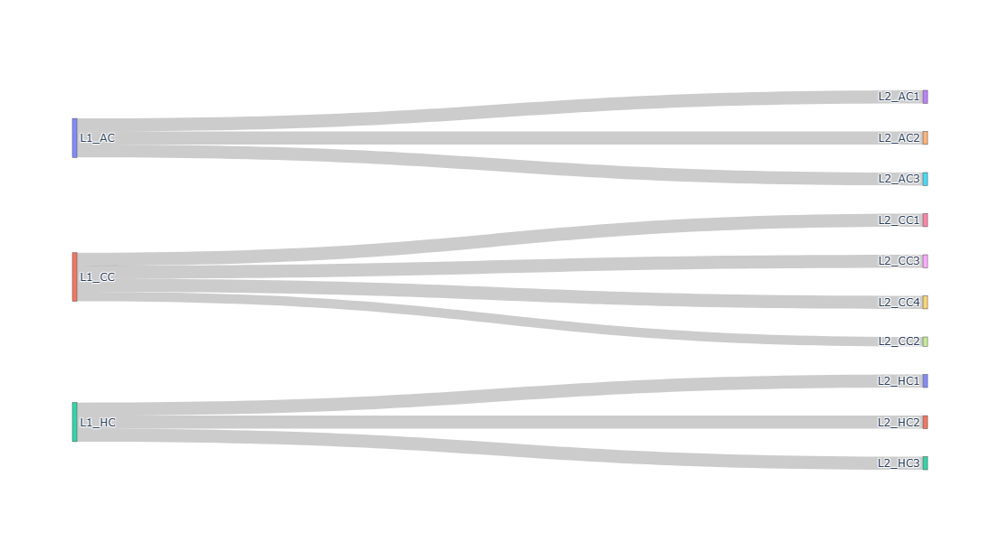

In [11]:
lst = [adata_t.obs['condition'], adata_t.obs['sample']]
plot_sankey(lst, title=None, fs=12, WH=(400, 600), th=30, title_y=0.85 )

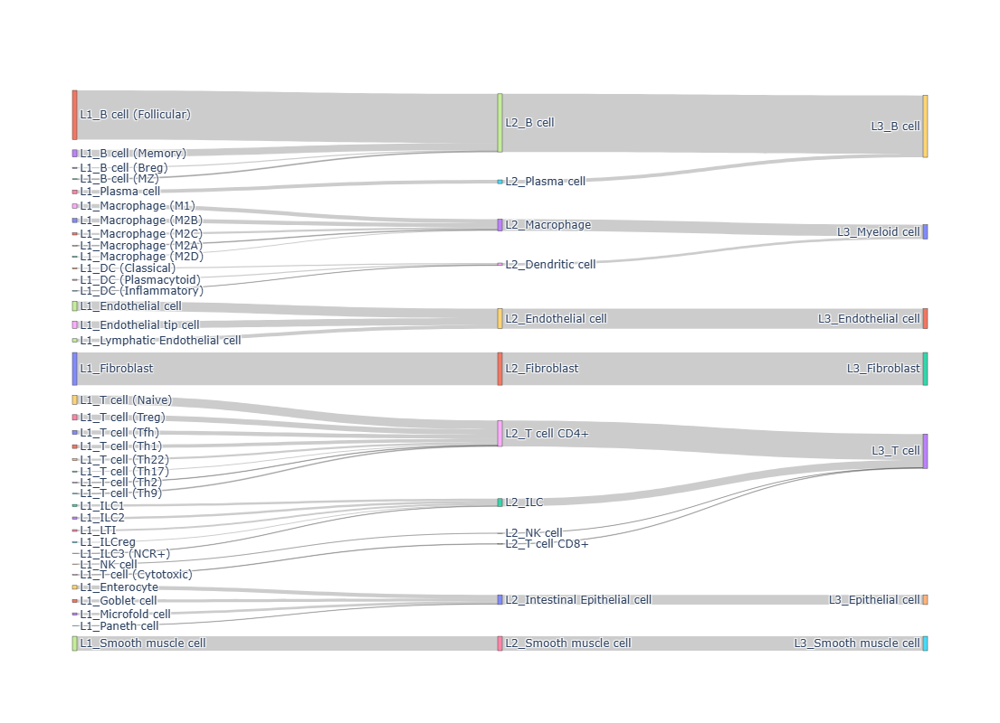

In [12]:
lst = [adata_t.obs['celltype_subset'], adata_t.obs['celltype_minor'], adata_t.obs['celltype_major']]
plot_sankey(lst, title=None, fs=12, WH=(700, 800), th=30, title_y=0.85 )

In [13]:
adata_t.obs['celltype_major'].value_counts()

celltype_major
B cell                12842
T cell                 7143
Fibroblast             6774
Endothelial cell       4164
Smooth muscle cell     2992
Myeloid cell           2975
Epithelial cell        2010
Name: count, dtype: int64

In [14]:
adata_t.obs['celltype_minor'].value_counts()

celltype_minor
B cell                        12078
Fibroblast                     6774
T cell CD4+                    5388
Endothelial cell               4164
Smooth muscle cell             2992
Macrophage                     2461
Intestinal Epithelial cell     2010
ILC                            1615
Plasma cell                     764
Dendritic cell                  514
T cell CD8+                     107
NK cell                          30
unassigned                        3
Name: count, dtype: int64

## __6. Explore your data__
### __UMAP 및 celltype annotation 결과__

In [17]:
### celltype 이름을 짧은 이름으로 대치
rename_dict = {}

lst = ['Epithelial cell', 'T cell', 'Smooth muscle cell',
       'Fibroblast', 'Myeloid cell', 'Endothelial cell', 'B cell']
lst2 = ['Epi', 'T cell', 'SMC', 'Fib', 'Myeloid', 'Endo', 'B cell']
## 이름 변경을 위한 dictionalry 생성
rename_dict['celltype_major'] = dict(zip(lst, lst2))

## minor type에 대해 동일한 과정으로 이름 변경
lst = ['Epithelial cell', 'T cell CD4+', 'T cell CD8+', 'Smooth muscle cell',
       'Fibroblast', 'ILC', 'Dendritic cell', 'Monocyte', 'Endothelial cell',
       'Macrophage', 'B cell', 'Plasma cell', 'NK cell',
       'Aneuploid Epithelial cell', 'Diploid Epithelial cell']
lst2 = ['Epi', 'T CD4+', 'T CD8+', 'SMC', 'Fib', 'ILC', 'DC', 'Mono',
        'Endo', 'Mac', 'B cell', 'Plasma', 'NK', 'Epi (Aneup)', 'Epi (Dip)']
rename_dict['celltype_minor'] = dict(zip(lst, lst2))

## subset에 대해 동일한 과정으로 이름 변경
lst = ['B cell (Breg)', 'B cell (Follicular)', 'B cell (MZ)', 'B cell(Memory)',
       'DC (Classical)', 'DC (Inflammatory)', 'DC (Plasmacytoid)', 'Monocyte',
       'Endothelial cell', 'Epithelial cell', 'Fibroblast',
       'ILC1', 'ILC2', 'ILC3 (NCR+)', 'ILC3 (NCR-)', 'ILCreg', 'LTI',
       'Macrophage (M1)', 'Macrophage (M2A)', 'Macrophage (M2B)', 'Macrophage (M2C)', 'Macrophage (M2D)',
       'NK cell', 'Plasma cell', 'Smooth muscle cell',
       'T cell (Cytotoxic)', 'T cell (Naive)', 'T cell (Tfh)', 'T cell (Th1)',
       'T cell (Th17)', 'T cell (Th2)', 'T cell (Th22)', 'T cell (Th9)',
       'T cell (Treg)', 'MDSC (Granulocytic)', 'MDSC (Monocytic)',
       'Endothelial tip cell', 'Lymphatic Endothelial cell', 'Luminal epithelial cell', 'Mammary epithelial cell' ]
lst2 = ['Breg', 'Bf', 'BMZ', 'Bmem', 'cDC', 'iDC', 'pDC', 'Mono', 'Endo',
        'Epi', 'Fib', 'ILC1', 'ILC2', 'ILC3(+)', 'ILC3(-)', 'ILCreg', 'LTI',
        'Mac_M1', 'Mac_M2a', 'Mac_M2b', 'Mac_M2c', 'Mac_M2d', 'NK', 'Plasma',
        'SMC', 'T_Cyto', 'T_Naive', 'Tfh', 'Th1', 'Th17', 'Th2', 'Th22', 'Th9',
        'Treg', 'MDSC_G', 'MDSC_M', 'Endo tip', 'Endo Lymp', 'Epi lum', 'Epi mam']
rename_dict['celltype_subset'] = dict(zip(lst, lst2))


In [18]:
## adata_t의 사본을 만들어서 adata에 저장
adata = adata_t[:,:]
## 이렇게하면 adata에 대해 처리한 내용이 원본에는 반영되지 않음

## UMAP 프로젝션을 얻기 위한 기본적 처리과정
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes = 2000)
sc.tl.pca(adata, n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=15, use_rep = 'X_pca')
sc.tl.umap(adata)

In [19]:
adata

AnnData object with n_obs × n_vars = 38900 × 20582
    obs: 'sample', 'condition', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset'
    var: 'gene_ids', 'feature_types', 'variable_genes', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'Pathways_DB', 'analysis_parameters', 'log', 'lut_sample_to_cond', 'usr_param', 'log1p', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'HiCAT_result', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

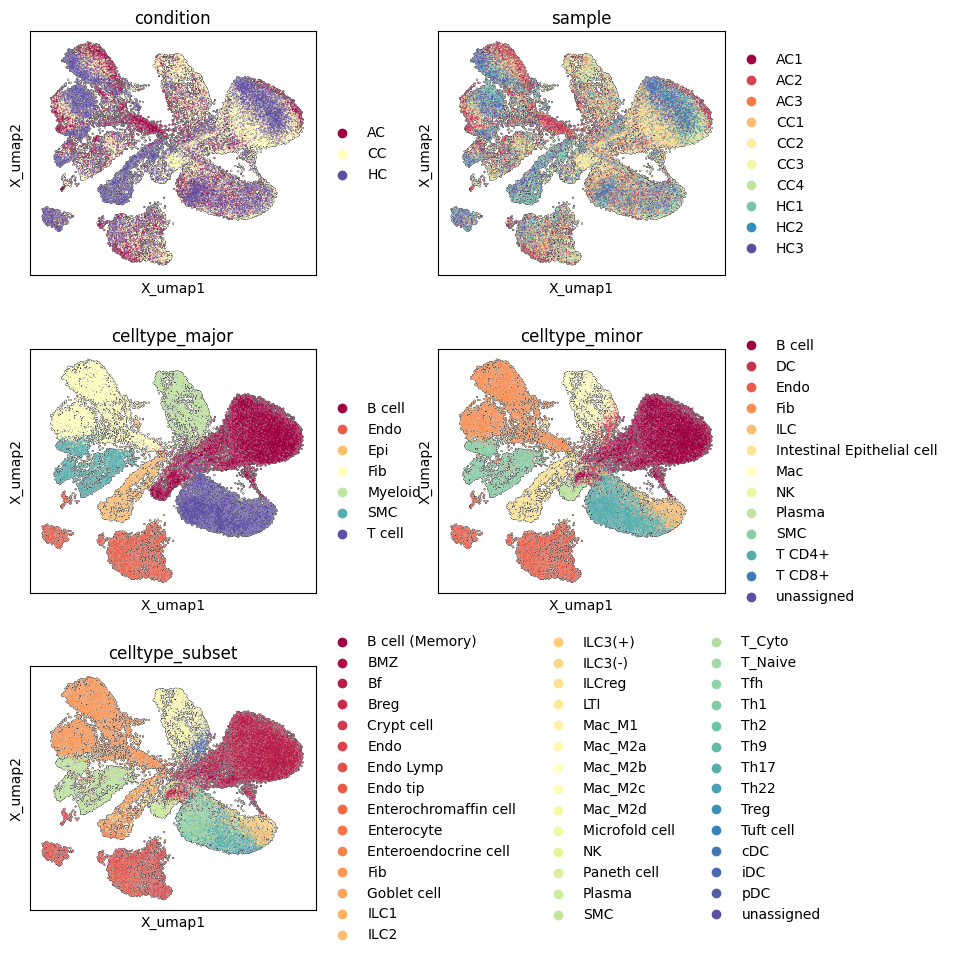

In [20]:
items_to_plot = ['condition', 'sample',
                 'celltype_major', 'celltype_minor', 'celltype_subset']

cols = ['celltype_major', 'celltype_minor', 'celltype_subset']
for col in cols:
    adata.obs[col] = adata.obs[col].astype(str)
    adata.obs[col].replace(rename_dict[col], inplace = True)

ws_hs = (0.3, 0.3)
plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                 color=items_to_plot, wspace = ws_hs[0], hspace = ws_hs[1], legend_fontsize = 10,
                 ncols = 2, palette = 'Spectral', add_outline = True)

plt.show()

- __HiCAT:__ https://github.com/combio-dku/HiCAT

Major type/minor type annotation이 잘 되었는지 확인하기 위해 잘 알려진 마커들의 발현 패턴을 확인함

In [21]:
adata.obs['celltype_minor'].value_counts()

celltype_minor
B cell                        12078
Fib                            6774
T CD4+                         5388
Endo                           4164
SMC                            2992
Mac                            2461
Intestinal Epithelial cell     2010
ILC                            1615
Plasma                          764
DC                              514
T CD8+                          107
NK                               30
unassigned                        3
Name: count, dtype: int64

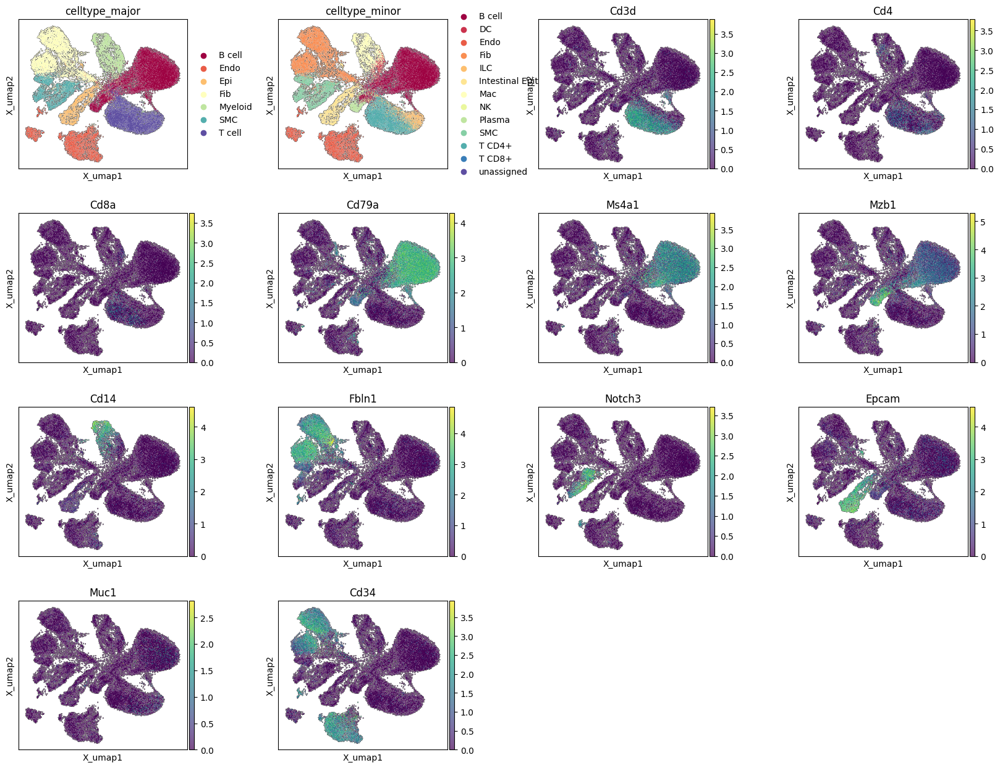

In [23]:
items_to_plot = ['celltype_major', 'celltype_minor']

genes = ['CD3D', 'CD4', 'CD8A', 'CD79A', 'MS4A1', 'MZB1',
         'CD14', 'LYZ', 'FBLN1', 'NOTCH3', 'EPCAM', 'MUC1',  'CD34']

## 위 목록의 마커 유전자들 중 현재의 데이터에 있는 유전자들만 순서대로 선택
genes_all = list(adata.var.index.values)
for g in genes:
    if adata_t.uns['usr_param']['species'] == 'mouse':
        g = g[:1] + g[1:].lower()
    if g in genes_all:
        items_to_plot = items_to_plot + [g]

plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                 color=items_to_plot, wspace = 0.4, hspace = 0.3, legend_fontsize = 10,
                 ncols = 4, palette = 'Spectral', add_outline = True)

plt.show()

#### __Subset marker expression pattern 확인__
- Subset annotation은 UMAP으로 확인하기 어려우므로 dot plot을 사용하여 확인
- dot의 크기는 annotation 결과 기준으로 해당 유형의 세포 중 얼마나 많은 비율이 해당 유정의 마커 유전자를 발현하고 있는지 보여줌


Num markers selected: 187 -> 120


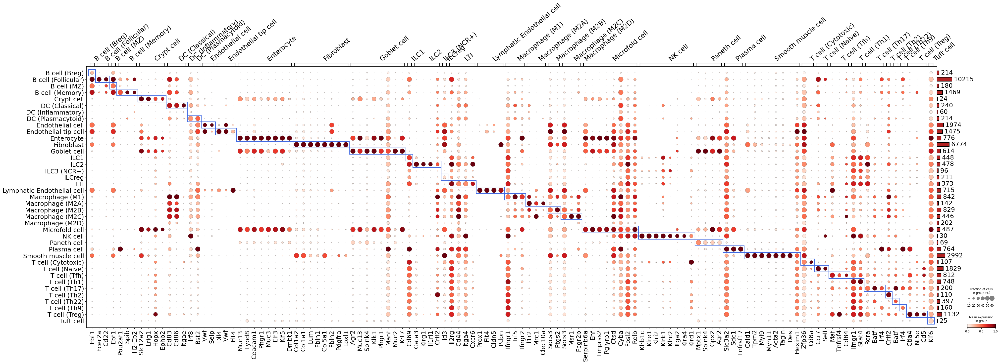

In [25]:
mkr_dict = copy.deepcopy( adata_t.uns['Celltype_marker_DB']['subset_markers_dict'] )

plot_marker_exp(  adata_t, markers = mkr_dict,
                  var_group_col = 'celltype_subset', group_col = None,
                  title = None, title_y_pos = 1.1, title_fs = 30,
                  text_fs = 18, linewidth = 1.5, standard_scale = 'var',
                  var_group_rotation = 40, var_group_height = 1.2,
                  nz_frac_max = 0.6, nz_frac_cutoff = 0.05,
                  rem_mkrs_common_in_N_groups_or_more = 3, N_cells_min = 20,
                  N_markers_per_group_max = 8, N_markers_total = 120,
                  figsize = None, swap_ax = False, legend = True )


### Myeloid cell들만 골라서 그려보죠

In [26]:
b = adata_t.obs['celltype_major'] == 'Myeloid cell'
adata = adata_t[b,:]

## UMAP 프로젝션을 얻기 위한 기본적 처리과정
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes = 1000)
sc.tl.pca(adata, n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=15, use_rep = 'X_pca')
sc.tl.umap(adata)

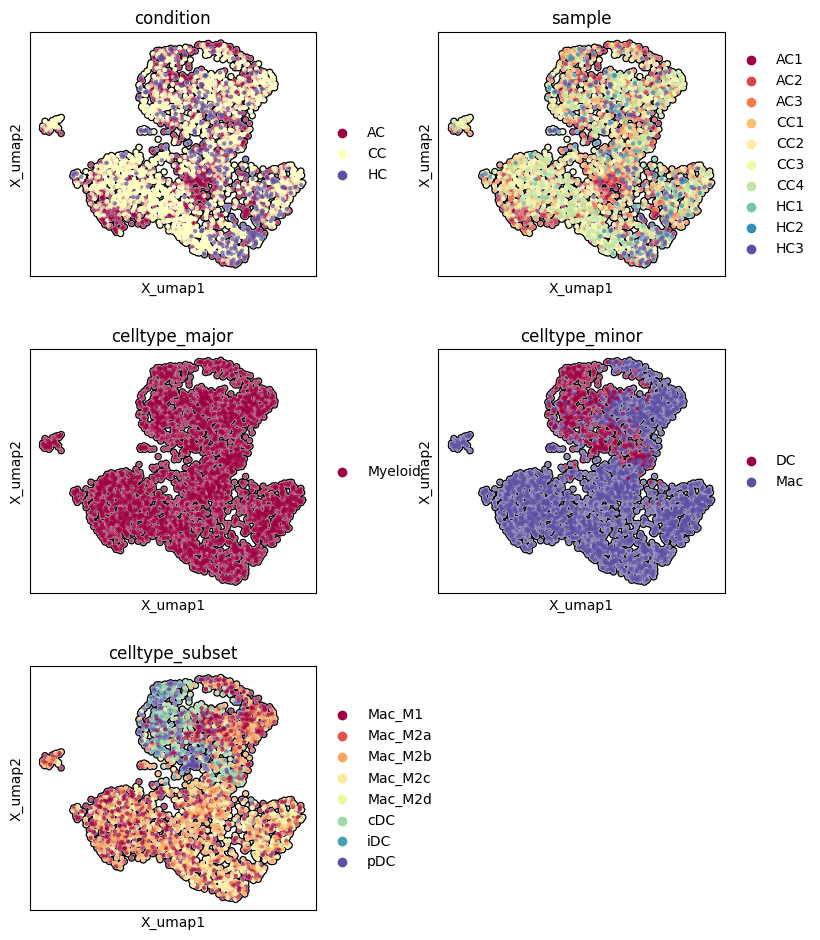

In [27]:
items_to_plot = ['condition', 'sample',
                 'celltype_major', 'celltype_minor', 'celltype_subset']

cols = ['celltype_major', 'celltype_minor', 'celltype_subset']
for col in cols:
    adata.obs[col] = adata.obs[col].astype(str)
    adata.obs[col].replace(rename_dict[col], inplace = True)

ws_hs = (0.3, 0.3)
plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                 color=items_to_plot, wspace = ws_hs[0], hspace = ws_hs[1], legend_fontsize = 10,
                 ncols = 2, palette = 'Spectral', add_outline = True)

plt.show()

### __Celltype Population 확인__


,B cell,Dendritic cell,Endothelial cell,Fibroblast,ILC,Intestinal Epithelial cell,Macrophage,NK cell,Plasma cell,Smooth muscle cell,T cell CD4+,T cell CD8+,unassigned
AC AC1,10.6,1.5,18.3,35.6,5.1,1.3,5.6,0.0,0.2,13.2,8.2,0.4,0.0
AC AC2,15.6,1.1,15.9,27.6,4.8,0.5,7.1,0.1,0.2,10.1,16.6,0.7,0.0
AC AC3,33.6,2.1,9.1,8.3,5.0,1.0,7.7,0.0,1.0,4.9,26.8,0.5,0.0
CC CC1,60.1,1.8,5.0,3.6,2.2,0.7,6.4,0.0,4.1,6.5,9.4,0.2,0.0
CC CC2,59.9,1.1,5.3,2.6,1.4,2.0,4.7,0.0,5.9,6.4,10.5,0.2,0.0
CC CC3,33.1,2.0,10.9,11.8,3.6,2.7,14.5,0.2,2.4,5.7,13.2,0.0,0.0
CC CC4,23.9,2.2,14.5,19.3,4.8,2.0,10.7,0.3,1.6,8.5,12.2,0.1,0.0
HC HC1,11.5,0.2,9.9,24.3,5.1,25.2,2.0,0.0,1.0,8.6,12.1,0.2,0.0
HC HC2,46.1,0.7,5.9,13.5,4.0,4.7,2.0,0.0,1.7,4.8,16.5,0.3,0.0
HC HC3,24.1,0.5,10.8,23.5,5.0,10.8,2.3,0.0,2.7,8.1,12.0,0.2,0.1


<Figure size 350x350 with 0 Axes>

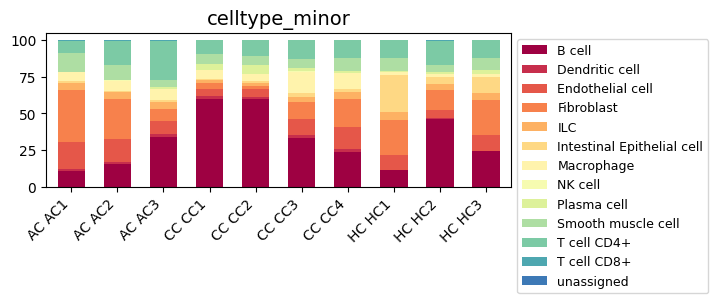

In [28]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
celltype_col = 'celltype_minor' ## 세포 유형의 기준
df_cnt, df_pct= get_population( adata_t.obs['sample_ext'],
                                adata_t.obs[celltype_col], sort_by = [] )
## 샘플별 세포 개수 확인
display(df_pct.round(1))

plot_population( df_pct, bar_width = 0.6,
                 title = celltype_col, title_fs = 14,
                 label_fs = 12, tick_fs = 10, xtick_rot = 45, xtick_ha = 'right',
                 legend_fs = 9, legend_loc = 'upper left', bbox_to_anchor = (1,1),
                 legend_ncol = 1, cmap_name = None, figsize=(6, 2), dpi = 100)

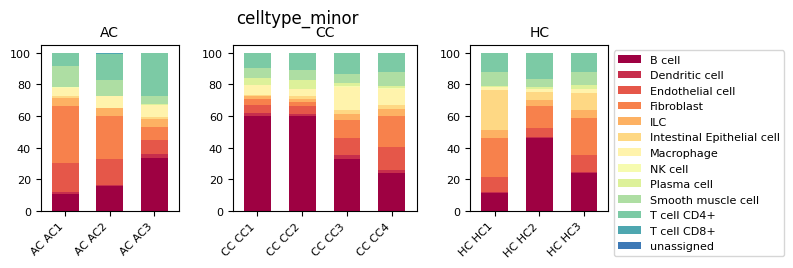

In [29]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
celltype_col = 'celltype_minor' ## 세포 유형의 기준
df_cnt, df_pct= get_population( adata_t.obs['sample_ext'],
                                adata_t.obs[celltype_col], sort_by = [] )

## 그룹별로 묶어서 barplot을 그리려면 샘플-그룹간 연결을 정의하는 dictionary를 가져와야 함.
sample_group_map = adata_t.uns['lut_sample_to_cond']

plot_population_grouped( df_pct, sample_group_map, sort_by = [], bar_width = 0.6,
                         title = celltype_col, title_fs = 12, title_y_pos = 1.12,
                         label_fs = 10, tick_fs = 8, xtick_rot = 45, xtick_ha = 'right',
                         legend_fs = 8, legend_loc = 'upper left', bbox_to_anchor = (1,1),
                         legend_ncol = 1, cmap_name = None, figsize=(7, 2), dpi = 100,
                         wspace = 0.35, hspace = 0.2 )

,CC_vs_AC,HC_vs_AC,HC_vs_CC
Dendritic cell,0.654870,0.046607,0.005911
Macrophage,0.382485,0.015035,0.050878
T cell CD8+,0.032613,0.057904,0.162186
Plasma cell,0.044838,0.095304,0.172525
Intestinal Epithelial cell,0.113739,0.173319,0.194159
ILC,0.076599,0.577470,0.101764
Fibroblast,0.208203,0.730432,0.086820
B cell,0.091209,0.589974,0.273818
NK cell,0.604459,0.134219,0.257563
T cell CD4+,0.389706,0.569774,0.277251


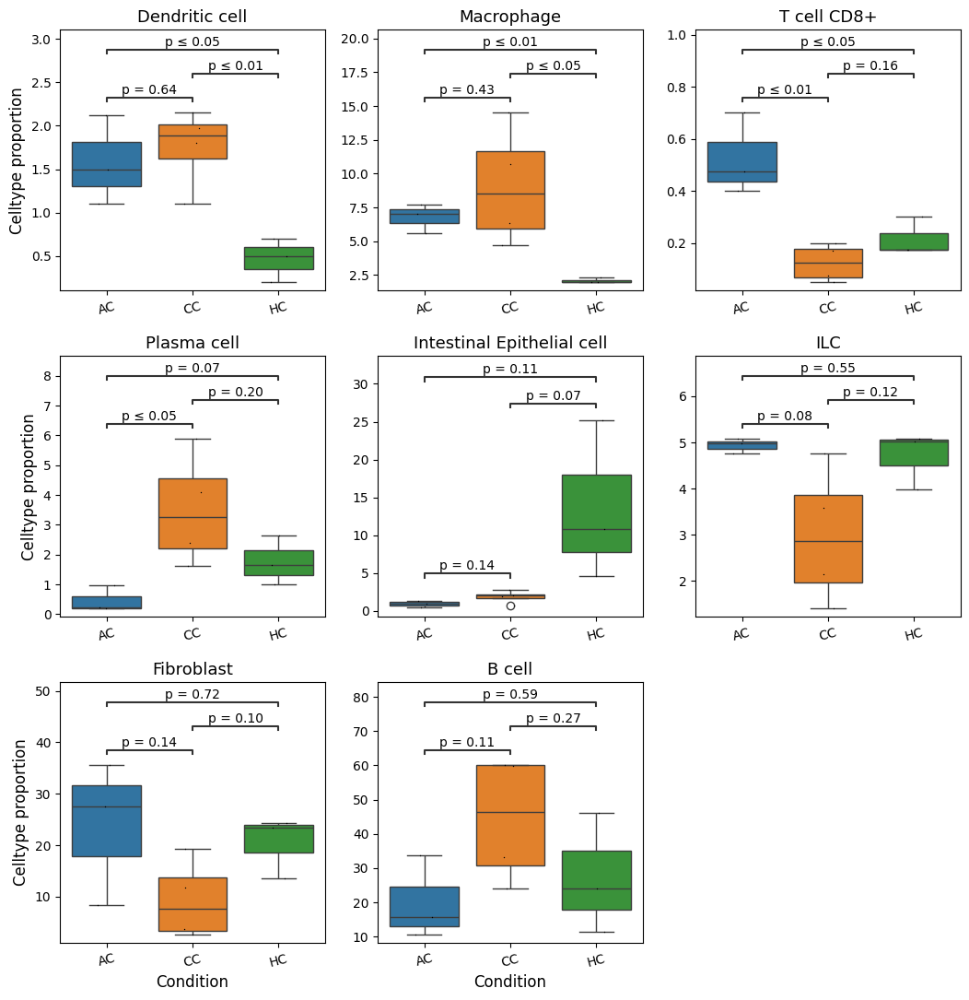

In [30]:
## 요부분은 sample 별 population을 얻어 조건별로 population이 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커짐 (p-value가 작아짐)

sample_group_map = adata_t.uns['lut_sample_to_cond']
df_res = test_group_diff( df_pct, sample_group_map,
                          ref_group = None, pval_cutoff = 0.8 )
# df_res = df_res.astype(float)
display(df_res)

## 표시할 결과 항목을 선택: 최대 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()

if len(idx_sel) > 0:
  idx_sel = idx_sel[:min(max_n_items_to_plot,len(idx_sel))]

if len(idx_sel) > 0:
    ## Show the first 5 CCIs
    plot_pct_box(df_pct[idx_sel], sample_group_map, ylabel = 'Celltype proportion',
                 ncols = 3, figsize = (3.5,3.5), dpi = 100,
                 group_order = None, # ['Normal', 'ER+', 'HER2+', 'TNBC'],
                 title = None, title_y_pos = 1.05, title_fs = 15,
                 label_fs = 12, tick_fs = 10, xtick_rot = 15,
                 annot_ref = None, annot_fmt = 'simple', annot_fs = 12,
                 ws_hs = (0.2, 0.25), stripplot = True)


#### __특정 세포유형의 subset population 확인__

,Macrophage (M1),Macrophage (M2A),Macrophage (M2B),Macrophage (M2C),Macrophage (M2D)
AC AC1,83,12,89,21,18
AC AC2,96,12,109,44,21
AC AC3,96,20,104,60,27
CC CC1,95,8,81,48,23
CC CC2,51,6,42,27,10
CC CC3,223,32,181,106,38
CC CC4,140,29,144,86,29
HC HC1,16,3,32,18,10
HC HC2,19,11,25,11,13
HC HC3,23,9,22,25,13


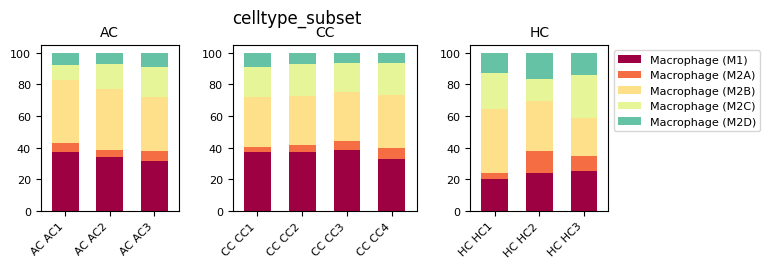

In [32]:
## 특정 세포유형의 subset별 상대비율을 얻기 위해 특정 세포 유형만 선택
## 이 경우 Macrophage subset의 상대비율을 보기 위해 먼저 minor type이 macrophage인 cell들만 선택
b = adata_t.obs['celltype_minor'] == 'Macrophage'
adata_s = adata_t[b,:]

## 샘플별 세포 개수 확인
sample_group_map = get_sample_to_group_map(adata_s.obs['sample_ext'],
                                           adata_s.obs['condition'])

## 샘플별로 macrophage subset의 개수와 상대비율을 얻어서 데이터프레임에 저장
col = 'celltype_subset'
df_cnt, df_pct = get_population( adata_s.obs['sample_ext'],
                                adata_s.obs[col], sort_by = [] )
display(df_cnt)

plot_population_grouped( df_pct, sample_group_map, sort_by = [],
                         title = col, title_fs = 12, title_y_pos = 1.12,
                         label_fs = 10, bar_width = 0.6,
                         tick_fs = 8, xtick_rot = 45, xtick_ha = 'right',
                         legend_fs = 8, legend_loc = 'upper left',
                         bbox_to_anchor = (1,1), legend_ncol = 1,
                         cmap_name = None, figsize=(7, 2), wspace = 0.35, dpi = 100)

,CC_vs_AC,HC_vs_AC,HC_vs_CC
Macrophage (M1),0.343468,0.008484,0.001461
Macrophage (M2D),0.364652,0.019939,0.010830
Macrophage (M2C),0.272239,0.262719,0.654676
Macrophage (M2A),0.693689,0.325915,0.286198
Macrophage (M2B),0.079992,0.377122,0.978428


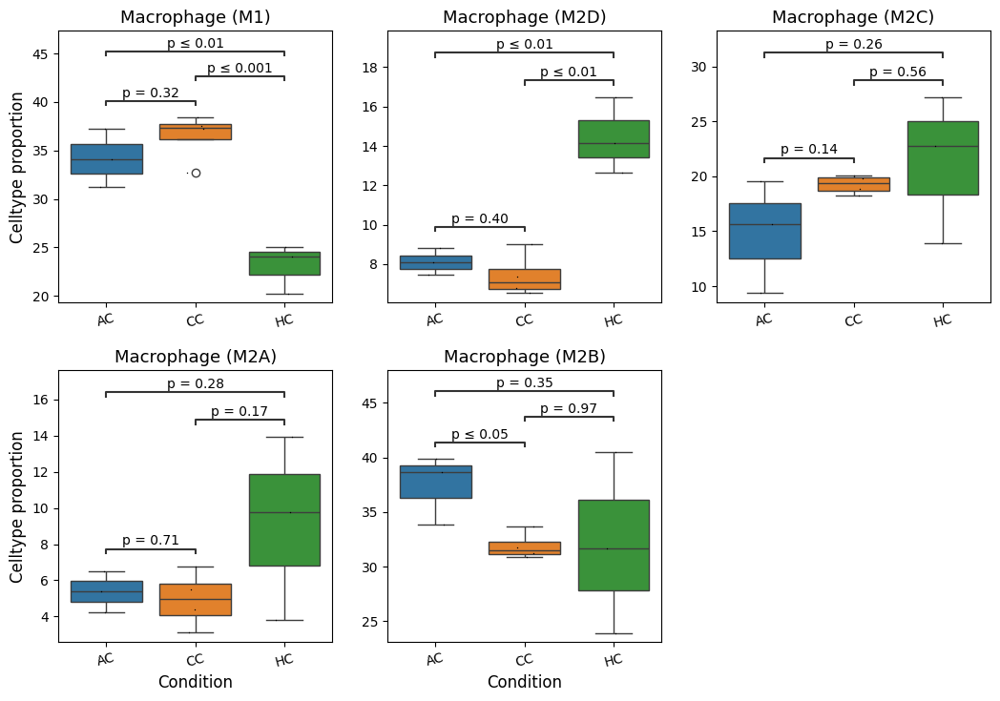

In [33]:
## 요부분은 sample 별 population을 얻어 조건별로 population이 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커짐 (p-value가 작아짐)

sample_group_map = adata_t.uns['lut_sample_to_cond']
df_res = test_group_diff( df_pct, sample_group_map,
                          ref_group = None, pval_cutoff = 0.8 )
# df_res = df_res.astype(float)
display(df_res)

## 표시할 결과 항목을 선택: 최대 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()

if len(idx_sel) > 0:
  idx_sel = idx_sel[:min(max_n_items_to_plot,len(idx_sel))]

if len(idx_sel) > 0:
    ## Show the first 5 CCIs
    plot_pct_box(df_pct[idx_sel], sample_group_map, ylabel = 'Celltype proportion',
                 ncols = 3, figsize = (3.5,3.5), dpi = 100,
                 group_order = None, # ['Normal', 'ER+', 'HER2+', 'TNBC'],
                 title = None, title_y_pos = 1.05, title_fs = 15,
                 label_fs = 12, tick_fs = 10, xtick_rot = 15,
                 annot_ref = None, annot_fmt = 'simple', annot_fs = 12,
                 ws_hs = (0.2, 0.25), stripplot = True)


### This does not work since tumor identification was not performed for this dataset

In [ ]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
# b = adata_t.obs['tumor_origin_ind']
# adata_s = adata_t[b,:]

# ## 샘플별 세포 개수 확인
# sample_group_map = get_sample_to_group_map(adata_s.obs['sample'],
#                                            adata_s.obs['condition'])

# col = 'ploidy_dec'
# df_cnt, df_pct= get_population( adata_s.obs['sample'],
#                                 adata_s.obs[col], sort_by = [] )

# plot_population_grouped( df_pct, sample_group_map, sort_by = ['Aneuploid'], bar_width = 0.6,
#                  title = None, title_fs = 10, title_y_pos = 1.15, dpi = 120,
#                  label_fs = 9, tick_fs = 8, xtick_rot = 90, xtick_ha = 'center',
#                  legend_fs = 8, legend_loc = 'upper left', bbox_to_anchor = (1,1),
#                  legend_ncol = 1, cmap_name = None, figsize=(6, 1), wspace = 0.35)


### __CNV & tumor cell identification 결과__
#### <font color=blue>(This works only if you checked "Tumor cell Identification" box when running SCODA)</font>

- __InferCNVpy:__ https://infercnvpy.readthedocs.io/en/latest/infercnv.html
- __InferPloidy:__

#### CNV 패턴 확인

In [ ]:
## adata_t의 사본을 만들어서 adata에 저장
## 이렇게하면 adata에 대해 처리한 내용이 원본에는 반영되지 않음
adata = adata_t[:,:]

## cell들을 Grouping 하기 위해 obs 필드에 'cell_group' 열을 새로 정의
## 기본적으로 major type의 이름을 사용
adata.obs['cell_group'] = adata.obs['celltype_major'].copy(deep = True).astype(str)

## InferCNV에 사용된 reference 세포 유형들은 'Normal ref'로 이름 변경
b = adata.obs['cnv_ref_ind']
adata.obs.loc[b, 'cell_group'] = 'Normal ref'

## condition 열에 정의된 유방암 subtype에 따라 암세포로 식별된 세포들의
## 이름에 유방암 subtype을 추가하여 이름 변경
## 예: condition이 ER+인 샘플중 Tumor cell들은 이름을 'Tumor ER+'로 변경
cond_col = 'condition'
clst = adata.obs[cond_col].unique()
for c in clst:
    b = (adata.obs[cond_col] == c) & (adata.obs['ploidy_dec'] == 'Aneuploid')
    s = 'Aneuploid Epi in %s' % c
    adata.obs.loc[b, 'cell_group'] = s

## 'cell_group'열 기준으로 Grouping하여 각 그룹별 CNV 패턴을 비교
axd = plot_cnv( adata, groupby = 'cell_group',
                title = 'log2(CNR)', title_fs = 12, title_y_pos = 1.15,
                label_fs = 12, tick_fs = 11,
                figsize = (15, 8), swap_axes = False,
                var_group_rotation = 90, cmap='RdBu_r', vmax = 1,
                cnv_obsm_key = 'X_cnv', cnv_uns_key = 'cnv', show_ticks = True,
                xlabel = 'Genomic spot', xtick_rot = 0, xtick_ha = 'center')

#### Tumor cell로 식별된 세포들만 골라서 샘플별로 CNV 패턴 비교

In [ ]:
b = adata.obs['tumor_origin_ind']
adata_s = adata[b,:]

cell_grouping = 'sample_ext_for_deg'

## cell 수가 일정 수 이상인 샘플들만 선택
pcnt = adata_s.obs[cell_grouping].value_counts()
bp = pcnt >= 200
b = adata_s.obs[cell_grouping].isin(list(pcnt.index.values[bp]))
adata_ss = adata_s[b,:]

## cell_grouping열 기준으로 Grouping하여 각 그룹별 CNV 패턴을 비교
axd = plot_cnv( adata_ss, groupby = cell_grouping,
                title = None, title_fs = 12, title_y_pos = 1.15,
                label_fs = 12, tick_fs = 10,
                figsize = (15, 8), swap_axes = False,
                var_group_rotation = 90, cmap='RdBu_r', vmax = 1,
                cnv_obsm_key = 'X_cnv', cnv_uns_key = 'cnv', show_ticks = True,
                xlabel = 'Genomic spot', xtick_rot = 0, xtick_ha = 'center')

### Finding genomic spots where CNV has a peak

In [ ]:
## Select cells of interest
b = (adata_t.obs['condition'] == 'HER2+') & (adata_t.obs['celltype_for_cci'] == 'Aneuploid Epithelial cell')
adata_s = adata_t[b,:]

cnv_peaks = find_genomic_spots_of_cnv_peaks( adata_s, group_col = None, width = 5, std_scale = 5, q = 0.5 )
cnv_peaks

In [ ]:
## Select cells of interest
b = adata_t.obs['celltype_for_cci'] == 'Aneuploid Epithelial cell'
adata_s = adata_t[b,:]

cnv_peaks = find_genomic_spots_of_cnv_peaks( adata_s, group_col = 'condition', width = 5, std_scale = 5, q = None )
cnv_peaks

In [ ]:
cnv_peaks['HER2+']

#### CNV 패턴을 UMAP 차원 축소하여 확인

In [ ]:
# adata = adata_t[:,:]

sc.pp.neighbors(adata, n_neighbors=10, n_pcs=10, use_rep = 'X_cnv_pca', key_added = 'cnv_neighbors')
ad_tmp = sc.tl.umap(adata, neighbors_key = 'cnv_neighbors', copy = True)
adata.obsm['X_cnv_umap'] = ad_tmp.obsm['X_umap']
# sc.tl.leiden(adata, resolution = 4, neighbors_key = 'cnv_new', key_added = 'cnv_cluster')

In [ ]:
items_to_plot = ['condition', 'sample', 'ploidy_dec', 'celltype_major',
                 'cnv_ref_ind', 'tumor_origin_ind', 'ploidy_score']

adata.obs['cnv_ref_ind'] = adata.obs['cnv_ref_ind'].astype(str)
adata.obs['tumor_origin_ind'] = adata.obs['tumor_origin_ind'].astype(str)

plt.rcParams['figure.figsize'] = (3.5, 3.5)
fig = sc.pl.embedding( adata, basis = 'X_cnv_umap', neighbors_key = 'cnv_neighbors',
                       color=items_to_plot, wspace = 0.35, legend_fontsize = 10,
                       ncols = 2, palette = 'Spectral', return_fig = False,
                       add_outline = True)
plt.show()

In [ ]:
adata_t

In [ ]:
adata_t.uns['CCI'].keys()

### __Cell-cell interaction 분석결과__
- 샘플별 CCI 결과와 조건별 CCI 결과가 따로 저장되어 있음
- 데이터 포맷은 두 결과가 동일함
- 조건별 CCI는 해당 조건에 포함된 샘플중 일정 퍼센트 이상의 샘플에서 공통적으로 확인된 것들만 추린 것임.

- __CellPhoneDB:__ https://www.cellphonedb.org/
- __CCI_sample__ data structure

##### __Cell-cell interaction 결과 데이터의 구성__

<div>
<img src="https://drive.google.com/uc?export=view&id=1091cGa6DqKSybzWSd6YE7amC2HDqNIn6" align="center" width="320"/>
</div>

<div>
<img src=attachment:48abf5fd-8f00-4f14-9a91-bb5b872d7275.png width="320"/>   
</div>

In [34]:
## 샘플 별 CCI 결과
cci_df_dct = adata_t.uns['CCI_sample']
sample_lst = list(cci_df_dct.keys())
sample_lst

['AC AC1',
 'AC AC2',
 'AC AC3',
 'CC CC1',
 'CC CC2',
 'CC CC3',
 'CC CC4',
 'HC HC1',
 'HC HC2',
 'HC HC3']

In [35]:
## CCI 결과의 형식
cci_df_dct[sample_lst[-1]].tail()

,gene_pair,cell_pair,gene_A,gene_B,cell_A,cell_B,pval,mean
TGFB1_TGFbeta_receptor2--T cell CD4+|Smooth muscle cell,TGFB1_TGFbeta_receptor2,T cell CD4+|Smooth muscle cell,TGFB1,TGFbeta_receptor2,T cell CD4+,Smooth muscle cell,0.024,0.435
LTB_LTBR--T cell CD4+|Smooth muscle cell,LTB_LTBR,T cell CD4+|Smooth muscle cell,LTB,LTBR,T cell CD4+,Smooth muscle cell,0.000,0.603
SELPLG_SELL--T cell CD4+|T cell CD4+,SELPLG_SELL,T cell CD4+|T cell CD4+,SELPLG,SELL,T cell CD4+,T cell CD4+,0.000,0.573
IFNG_Type_II_IFNR--T cell CD4+|T cell CD4+,IFNG_Type_II_IFNR,T cell CD4+|T cell CD4+,IFNG,Type_II_IFNR,T cell CD4+,T cell CD4+,0.000,0.396
SEMA4D_PTPRC--T cell CD4+|T cell CD4+,SEMA4D_PTPRC,T cell CD4+|T cell CD4+,SEMA4D,PTPRC,T cell CD4+,T cell CD4+,0.000,1.950


#### __각 샘플(조건)별 상세 내용__

In [36]:
cci_df_dct = adata_t.uns['CCI']

4 cell_pairs, 61 gene_pairs found


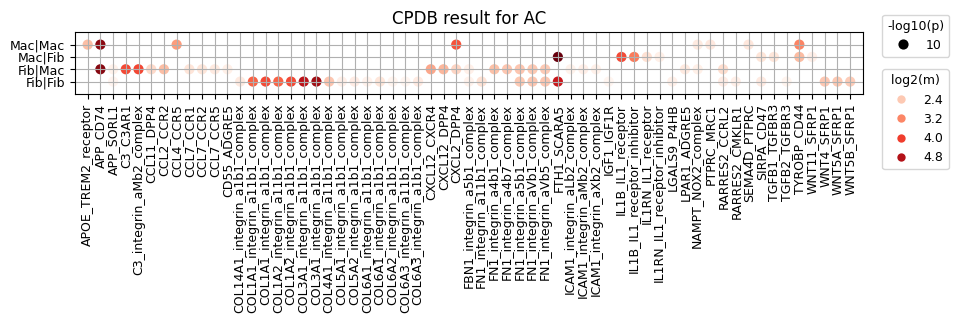

4 cell_pairs, 61 gene_pairs found


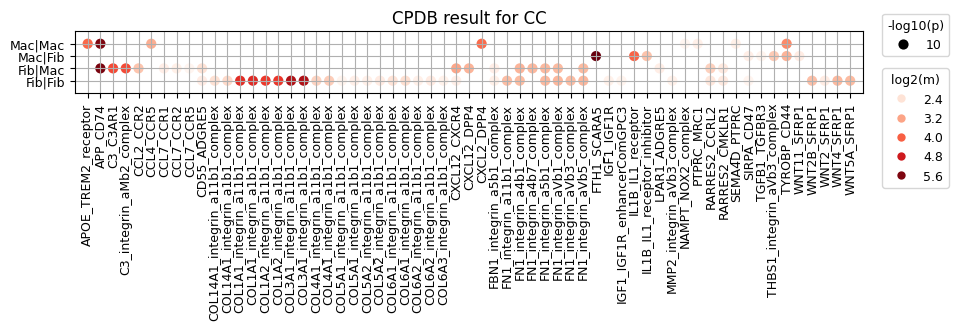

4 cell_pairs, 61 gene_pairs found


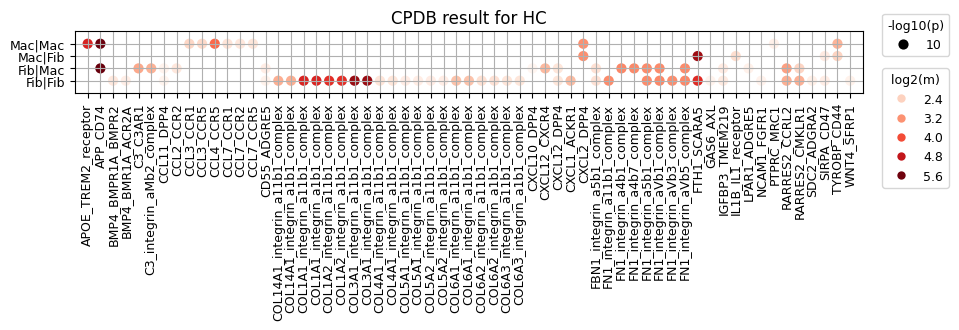

In [37]:
## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = ['Epithelial cell', 'Macrophage', 'Fibroblast']
target_genes = []

## 세포 유형 이름을 약어로 대치 (앞에서 만들어 놓은 dictionary 사용)
rend = rename_dict['celltype_minor']

## 각 샘플별(조건별)로 CCI 확인.
## p-value, cci mean으로 정렬하여 일정 개수의 상호작용만 표시
for g in cci_df_dct.keys():
    dfv = cci_df_dct[g]
    ax = plot_cci_dot( dfv, n_gene_pairs = 60,
                       pval_cutoff = 0.1, mean_cutoff = 0.1, rename_cells = rend,
                       target_cells = target_cells, target_genes = target_genes,
                       title = 'CPDB result for %s' % g, title_fs = 12,
                       legend_fs = 9, legend_mkr_sz = 9,
                       tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
                       dpi = 100, swap_ax = True, cmap = 'Reds')

4 cell_pairs, 121 gene_pairs found


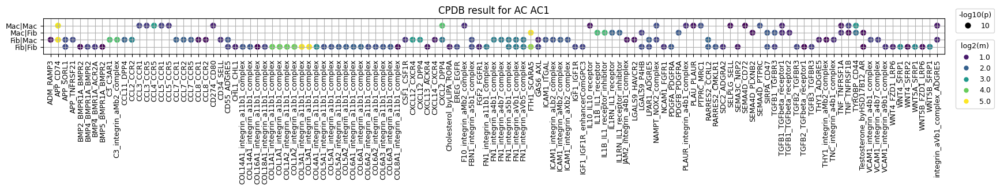

4 cell_pairs, 121 gene_pairs found


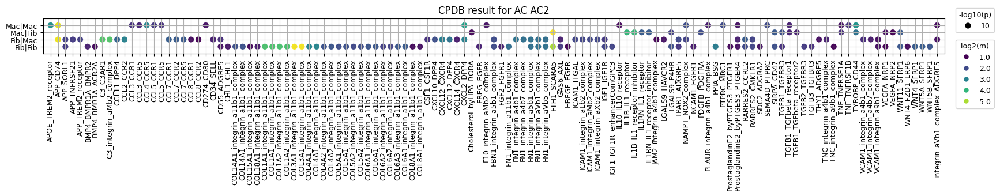

4 cell_pairs, 121 gene_pairs found


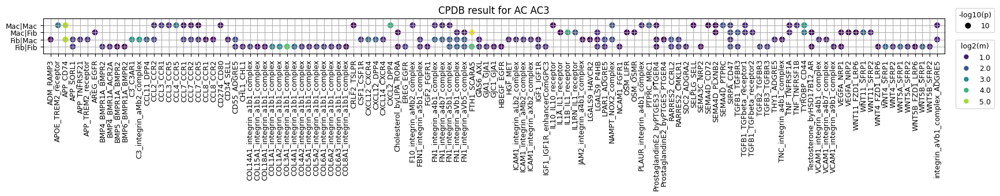

4 cell_pairs, 121 gene_pairs found


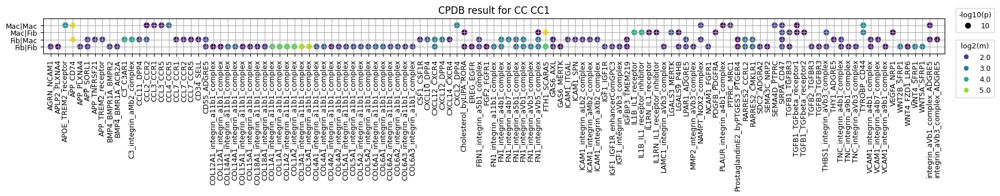

4 cell_pairs, 121 gene_pairs found


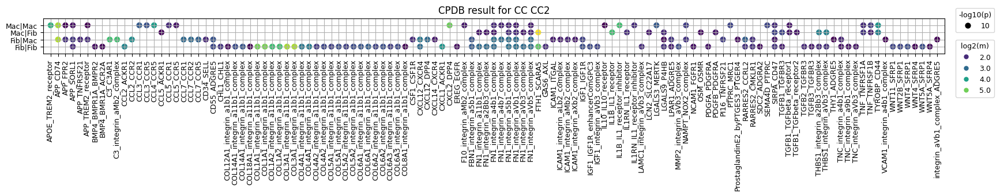

4 cell_pairs, 121 gene_pairs found


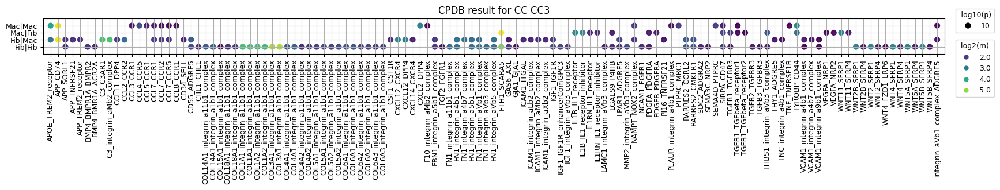

4 cell_pairs, 121 gene_pairs found


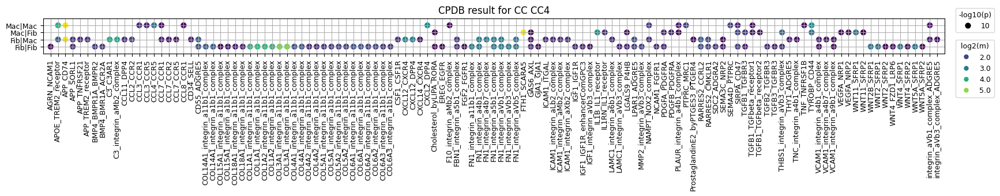

4 cell_pairs, 121 gene_pairs found


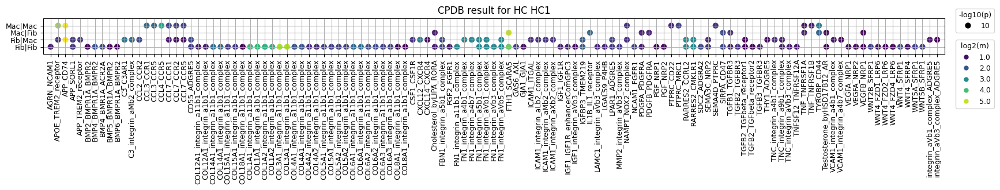

4 cell_pairs, 121 gene_pairs found


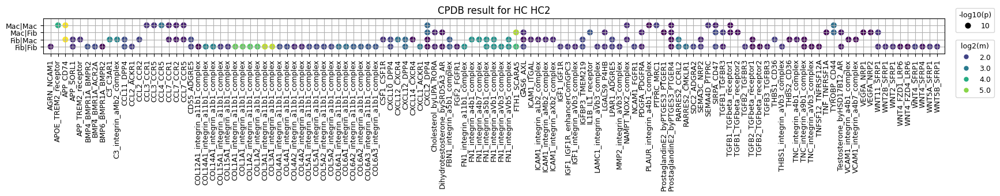

4 cell_pairs, 121 gene_pairs found


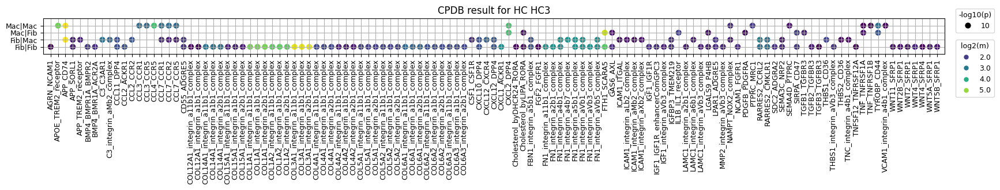

In [39]:
cci_df_dct_per_cond = adata_t.uns['CCI_sample']

## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = ['Epithelial cell', 'Macrophage', 'Fibroblast']
target_genes = []

## 세포 유형 이름을 약어로 대치 (앞에서 만들어 놓은 dictionary 사용)
rend = rename_dict['celltype_minor']

## 각 샘플별(조건별)로 CCI 확인.
## p-value, cci mean으로 정렬하여 일정 개수의 상호작용만 표시
for g in cci_df_dct_per_cond.keys():
    dfv = cci_df_dct_per_cond[g]
    ax = plot_cci_dot( dfv, n_gene_pairs = 120,
                       pval_cutoff = 0.1, mean_cutoff = 0.1, rename_cells = rend,
                       target_cells = target_cells, target_genes = target_genes,
                       title = 'CPDB result for %s' % g, title_fs = 12,
                       legend_fs = 9, legend_mkr_sz = 9,
                       tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
                       dpi = 100, swap_ax = True, cmap = None ) # 'Reds')

#### __CCI mean difference between conditions__
샘플별 CCI 결과에서 모든 샘플에서 공통적으로 확인된 CCI를 골라서 \
각 조건별로 상호작용의 강도간 유의한 차이가 있는지 확인할 수 있음

In [40]:
cci_df_dct = adata_t.uns['CCI_sample']
target_cells = ['Macrophage']
target_genes = []

## mean 값을 가져오된 pval가 cutoff 보다 작은 것들만 가져옴
df = get_cci_means( cci_df_dct, cci_idx_lst = None,
                    cells = target_cells, genes = target_genes, pval_cutoff = 0.05 )
## cci_idx_lst를 None으로 설정하면 cci_df_dct에 있는 모든 CCI들의 union에 대한 결과를 리턴함 (pval_cutoff은 적용됨)
## 리턴 결과가 0인 것은 해당 샘플에서 해당 CCI가 검출되지 않은 것임.

## 샘플별 세포 개수 확인
sample_group_map = get_sample_to_group_map(adata_t.obs['sample_ext'],
                                           adata_t.obs['condition'])

df_res = test_group_diff( df, sample_group_map, ref_group = None, pval_cutoff = 0.05 )
df_res

,CC_vs_AC,HC_vs_AC,HC_vs_CC
SELPLG_SELP--Macrophage|Endothelial cell,0.002310,0.002031,0.000880
THY1_ADGRE5--T cell CD4+|Macrophage,0.012395,0.018510,0.000600
VCAM1_integrin_a4b1_complex--Endothelial cell|Macrophage,0.017868,0.043521,0.000683
RARRES2_CCRL2--Fibroblast|Macrophage,0.041004,0.000834,0.039814
CXCL10_DPP4--Endothelial cell|Macrophage,0.043709,0.041391,0.004398
...,...,...,...
TNF_TNFRSF1A--Macrophage|Dendritic cell,0.044516,1.000000,1.000000
TGFB1_TGFbeta_receptor1--Macrophage|Plasma cell,1.000000,1.000000,0.044759
LGALS9_P4HB--Macrophage|Intestinal Epithelial cell,1.000000,1.000000,0.045412
CD34_SELL--Fibroblast|Macrophage,0.047013,1.000000,1.000000


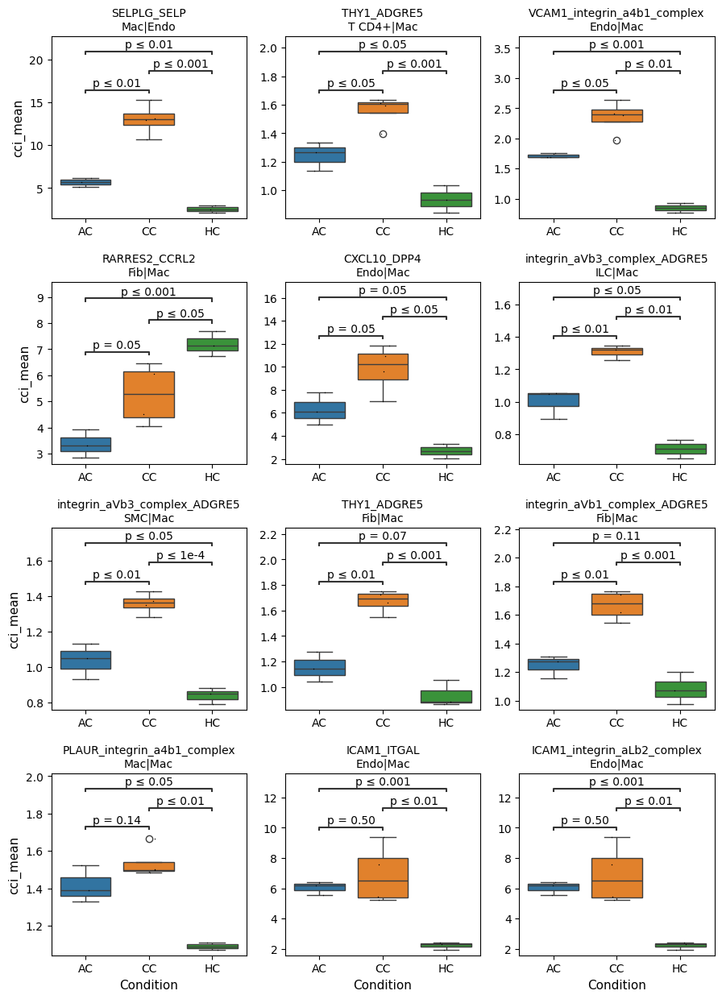

In [41]:
## 요부분은 sample 별 CCI의 mean이(CCI의 강도가) 조건별로 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커지고요. (p-value가 작아지고요)

## 표시할 결과 항목을 선택: 앞에서 4개만
num_items_to_plot = 12
idx_sel = df_res.index.values.tolist()[:num_items_to_plot]

if len(idx_sel) > 0:
    df_sel = df[idx_sel].copy(deep = True)

    ## index 이름에서 '--'를 '\n'로 대체
    idx_org = list(df_sel.columns.values)
    idx_new = [s.replace('--', '\n') for s in idx_org]
    rend = dict(zip(idx_org, idx_new))
    df_sel = df_sel.rename(columns = rend)

    ## 세포 유형 이름을 약어로 대치 (앞에서 만들어 놓은 dictionary 사용)
    rend = rename_dict['celltype_minor']

    plot_pct_box(df_sel, sample_group_map, ylabel = 'cci_mean',
              ncols = 3, figsize = (3,3), dpi = 100, rename_cells = rend,
              title = None, title_y_pos = 1.05, title_fs = 12,
              label_fs = 11, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
              annot_ref = None, annot_fmt = 'simple', annot_fs = 10,
              ws_hs = (0.2, 0.35), stripplot = True)

In [42]:
cci_df_dct = adata_t.uns['CCI_sample']
target_cells = ['Macrophage']
target_genes = ['IL1B', 'NAMPT']

## mean 값을 가져오된 pval가 cutoff 보다 작은 것들만 가져옴
df = get_cci_means( cci_df_dct, cci_idx_lst = None,
                    cells = target_cells, genes = target_genes, pval_cutoff = 0.05 )
## cci_idx_lst를 None으로 설정하면 cci_df_dct에 있는 모든 CCI들의 union에 대한 결과를 리턴함 (pval_cutoff은 적용됨)
## 리턴 결과가 0인 것은 해당 샘플에서 해당 CCI가 검출되지 않은 것임.

## 샘플별 세포 개수 확인
sample_group_map = get_sample_to_group_map(adata_t.obs['sample_ext'],
                                           adata_t.obs['condition'])

df_res = test_group_diff( df, sample_group_map, ref_group = None, pval_cutoff = 0.05 )
df_res

,CC_vs_AC,HC_vs_AC,HC_vs_CC
IL1B_IL1_receptor--Macrophage|Fibroblast,0.786983,0.007567,0.046075
NAMPT_NOX2_complex--Endothelial cell|Macrophage,0.429213,0.046913,0.026341
IL1B_IL1_receptor--Macrophage|Smooth muscle cell,0.269857,0.110341,0.000907
NAMPT_NOX2_complex--Macrophage|Macrophage,0.473107,0.130282,0.039560
NAMPT_NOX2_complex--T cell CD4+|Macrophage,0.994235,0.416314,0.008540


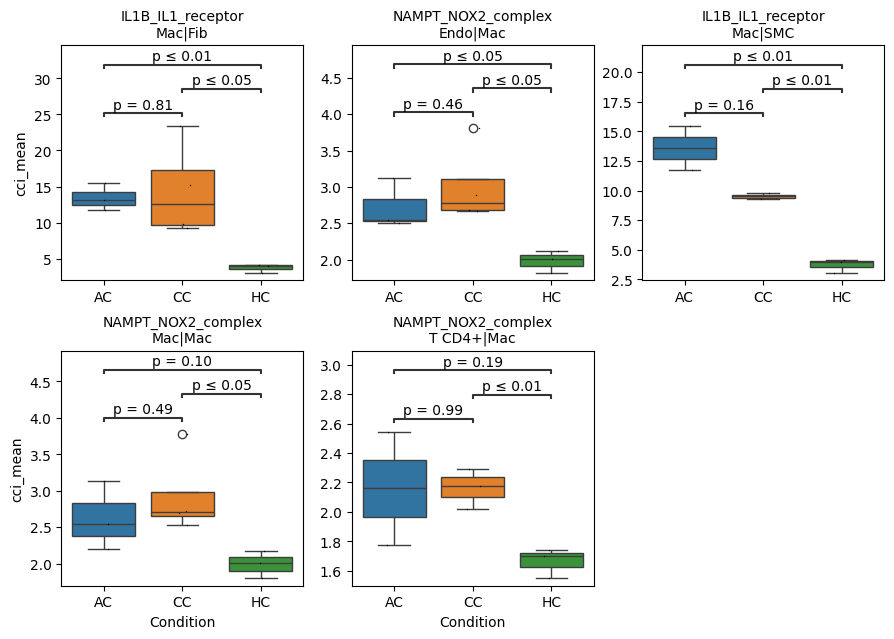

In [43]:
## 요부분은 sample 별 CCI의 mean이(CCI의 강도가) 조건별로 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커지고요. (p-value가 작아지고요)

## 표시할 결과 항목을 선택: 앞에서 4개만
idx_sel = df_res.index.values.tolist()

if len(idx_sel) > 0:
    df_sel = df[idx_sel].copy(deep = True)

    ## index 이름에서 '--'를 '\n'로 대체
    idx_org = list(df_sel.columns.values)
    idx_new = [s.replace('--', '\n') for s in idx_org]
    rend = dict(zip(idx_org, idx_new))
    df_sel = df_sel.rename(columns = rend)

    ## 세포 유형 이름을 약어로 대치 (앞에서 만들어 놓은 dictionary 사용)
    rend = rename_dict['celltype_minor']

    ## Show the selected CCIs
    plot_pct_box(df_sel, sample_group_map, ylabel = 'cci_mean',
              ncols = 3, figsize = (3,3), dpi = 100, rename_cells = rend,
              title = None, title_y_pos = 1.05, title_fs = 12,
              label_fs = 10, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
              annot_ref = None, annot_fmt = 'simple', annot_fs = 10,
              ws_hs = (0.2, 0.3), stripplot = True)

#### __cell-cell interactions pattern per sample__

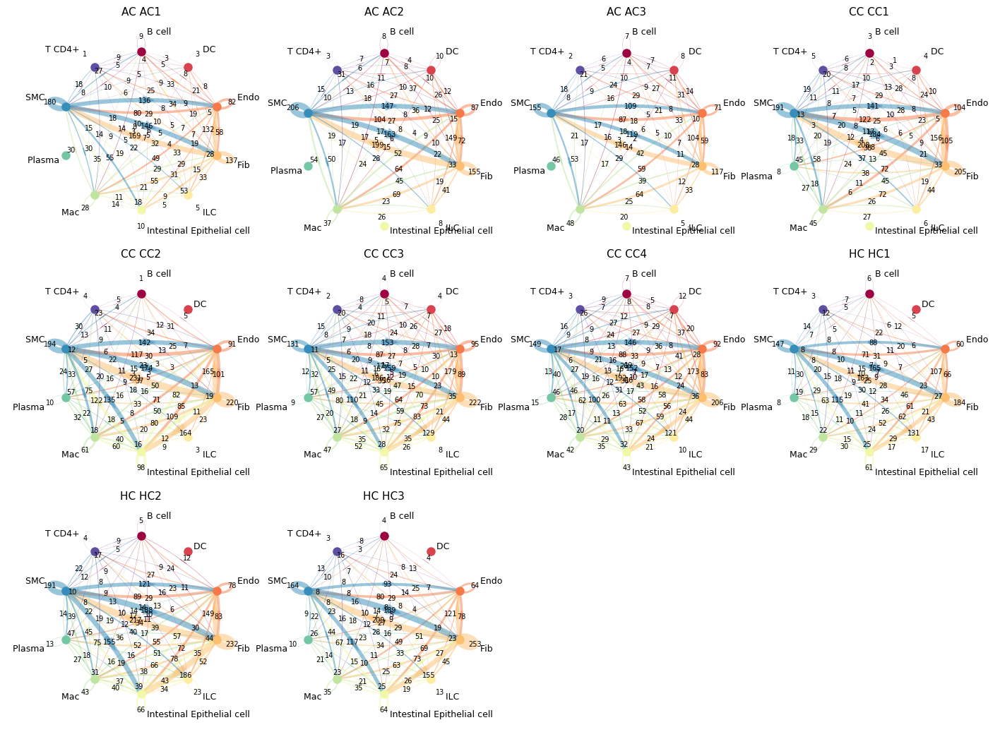

In [44]:
## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
cci_df_dct = adata_t.uns['CCI_sample']

## 세포 유형 이름을 약어로 대치 (앞에서 만들어 놓은 dictionary 사용)
rend = rename_dict['celltype_minor']

plot_cci_circ_group( cci_df_dct, target = None,
                     rename_cells = rend, remove_common = False,
                     ncol = 4, figsize = (3.5,3.5), dpi = 100,
                     title = None, title_y_pos = 1.1, title_fs = 24,
                     text_fs = 9, num_fs = 7, margin = 0.08,
                     alpha = 0.5, R_curvature = 3,
                     linewidth_max = 8, linewidth_log = False,
                     node_size = 8, rot = False, cmap = 'Spectral',
                     wspace = 0.15, hspace = 0.1 )

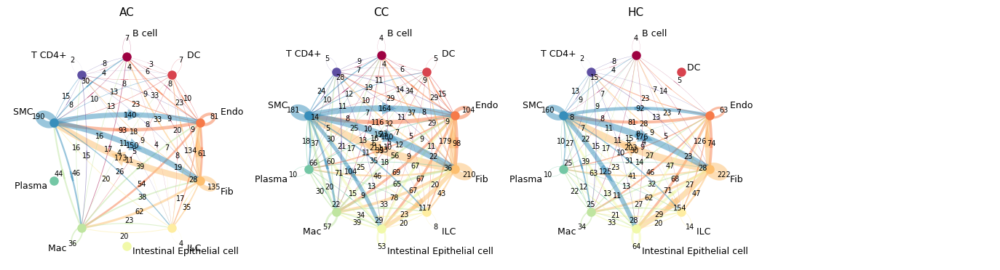

In [45]:
## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
cci_df_dct = adata_t.uns['CCI']

## 세포 유형 이름을 약어로 대치 (앞에서 만들어 놓은 dictionary 사용)
rend = rename_dict['celltype_minor']

plot_cci_circ_group( cci_df_dct, target = None,
                     rename_cells = rend, remove_common = False,
                     ncol = 4, figsize = (3.5,3.5), dpi = 100,
                     title = None, title_y_pos = 1.1, title_fs = 24,
                     text_fs = 9, num_fs = 7, margin = 0.08,
                     alpha = 0.5, R_curvature = 3,
                     linewidth_max = 8, linewidth_log = False,
                     node_size = 8, rot = False, cmap = 'Spectral',
                     wspace = 0.25, hspace = 0.1 )

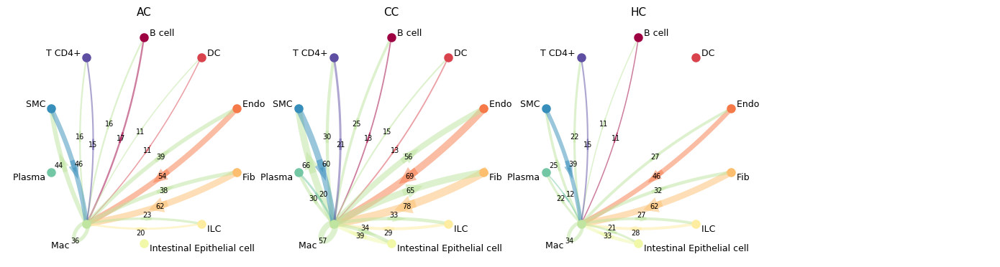

In [46]:
## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
cci_df_dct = adata_t.uns['CCI']

## 특정 세포유형을 중심으로 CCI 개수 확인 (이 경우 Epithelial cell을 중심으로 봄)
target = ['Mac']

## 세포 유형 이름을 약어로 대치 (앞에서 만들어 놓은 dictionary 사용)
rend = rename_dict['celltype_minor']

plot_cci_circ_group( cci_df_dct, target = target,
                     rename_cells = rend, remove_common = False,
                     ncol = 4, figsize = (3.5,3.5), dpi = 100,
                     title = None, title_y_pos = 1.1, title_fs = 24,
                     text_fs = 9, num_fs = 7, margin = 0.08,
                     alpha = 0.5, R_curvature = 3,
                     linewidth_max = 8, linewidth_log = False,
                     node_size = 8, rot = False, cmap = 'Spectral',
                     wspace = 0.15, hspace = 0.1 )

### __DEG 분석결과__
- DEG 결과는 각 세포 유형별로 처리되어 저장됨
- major, minor, subset 중 어느 수준을 기준으로 할지는 analysis_parameters에서 정의 할 수 있음
- 현재의 결과는 celltype_minor 기준으로 세포 유형별로 condition-specific DEG를 얻은 결과 임.

In [47]:
adata_t

AnnData object with n_obs × n_vars = 38900 × 20582
    obs: 'sample', 'condition', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset'
    var: 'gene_ids', 'feature_types', 'variable_genes'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'Pathways_DB', 'analysis_parameters', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_pca'

In [48]:
nc_deg_dct = adata_t.uns['DEG_stat'] ## DEG 분석에 사용된 셀수 정보
df_deg_dct = adata_t.uns['DEG'] ## DEG 분석 결과

In [49]:
## 어떤 세포 유형들에 대한 DEG 결과가 있는지 확인
list(df_deg_dct.keys())

## analysis_parameters에 정의한 DEG분석을 위한 최소 셀수(MIN_NUM_CELLS_FOR_DEG)보다
## 적은 셀수를 갖는 세포 유형에 대해서는 DEG 분석이 수행 되지 않음.
## (각 조건 별로 해당 유형의 셀수가 최소한 MIN_NUM_CELLS_FOR_DEG 정도되어야 DEG 분석이 수행됨)

['B cell',
 'Dendritic cell',
 'Endothelial cell',
 'Fibroblast',
 'ILC',
 'Intestinal Epithelial cell',
 'Macrophage',
 'Plasma cell',
 'Smooth muscle cell',
 'T cell CD4+']

##### __DEG 결과 데이터의 구성__

<div>
<img src="https://drive.google.com/uc?export=view&id=1N-XeRpAvUAlnuryLpll7sYyzGbKGK5eG" align="center" width="500"/>
</div>

<div>
<img src=attachment:f57fafbd-8253-4210-88ed-9acbc3224d08.png width="500"/>   
</div>

In [50]:
## 특정 세포 유형에 대한 DEG 분석 결과를 가져옴 (이경우 Epithelial cell)
target_cell = 'Macrophage'

df_deg = df_deg_dct[target_cell]
nc_deg = nc_deg_dct[target_cell]

## 해당 세포 유형에 사용된 조건 별 셀수 확인
nc_deg

{'AC_vs_others': {'AC': 600, 'others': 986},
 'CC_vs_others': {'CC': 736, 'others': 850},
 'HC_vs_others': {'HC': 250, 'others': 1336}}

In [51]:
df_deg['CC_vs_others'].head()

,log2_FC,pval,pval_adj,mean_test,mean_ref,nz_pct_test,nz_pct_ref,nz_pct_score,gene,Rp
Ighg2b,3.227,3.632093e-39,2.800707e-35,1.024235,0.174525,0.444293,0.091667,0.403567,Ighg2b,1.0
Cebpb,1.298,2.449919e-13,1.923186e-09,2.542544,1.751259,0.722826,0.526667,0.342138,Cebpb,1.0
Gm10076,0.713,5.276880e-07,4.069002e-03,0.895209,0.633146,0.531250,0.388333,0.324948,Gm10076,1.0
Ighm,1.254,1.215998e-08,9.545583e-05,1.125376,0.627348,0.494565,0.344000,0.324435,Ighm,1.0
Mpc1,0.843,5.050746e-06,3.964836e-02,0.958751,0.639996,0.516304,0.375000,0.322690,Mpc1,1.0


- nz_pct_score = nz_pct_test*(1-nz_pct_ref)
- nz_pct_test: percentage of cells with the gene expressed in test group
- nz_pct_ref: percentage of cells with the gene expressed in reference group

##### __DEG 분석결과 확인__

Macrophage


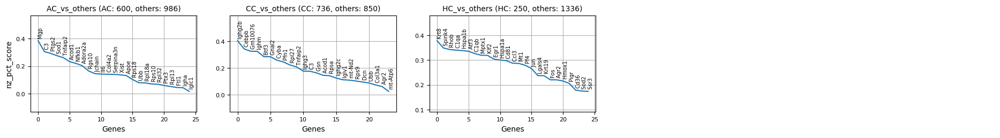

In [52]:
key = target_cell
df_deg = df_deg_dct[key]
nc_deg = nc_deg_dct[key]

n_genes_to_show = 25

print(key)
plot_deg( df_deg, reference = 'nz_pct_score',
          n_genes_to_show = n_genes_to_show, pval_cutoff = 0.01,
          figsize = (4,2), dpi = 100, text_fs = 7, title_fs = 10, label_fs = 10,
          tick_fs = 8, ncols = 5, wspace = 0.2, hspace = 0.5,
          deg_stat_dct = nc_deg, show_log_pv = False )


B cell


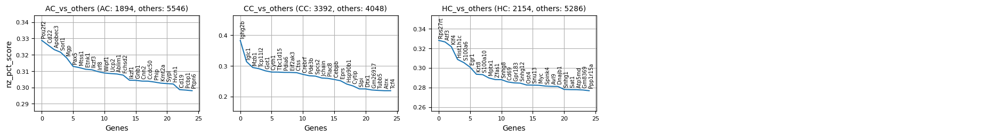

Dendritic cell


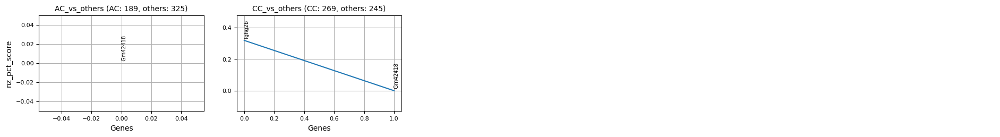

Endothelial cell


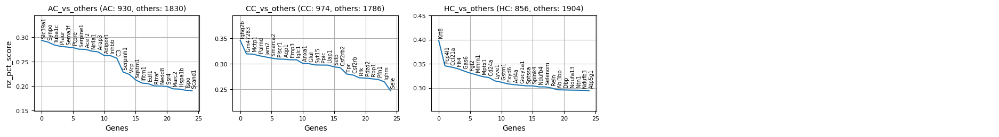

Fibroblast


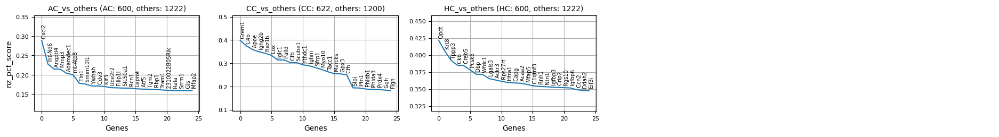

ILC


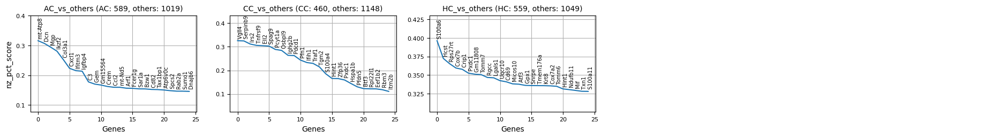

Intestinal Epithelial cell


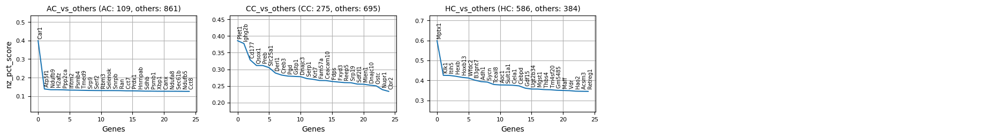

Macrophage


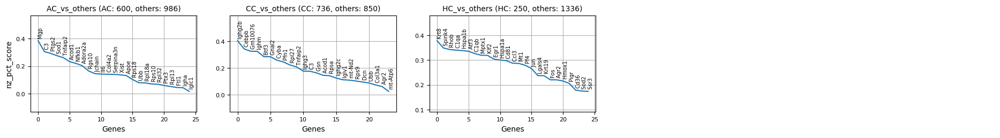

Plasma cell


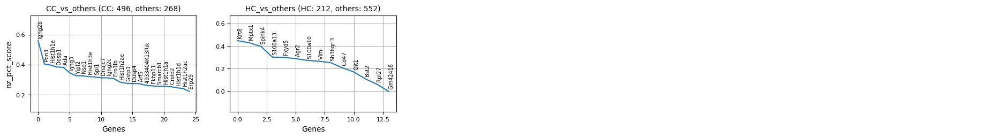

Smooth muscle cell


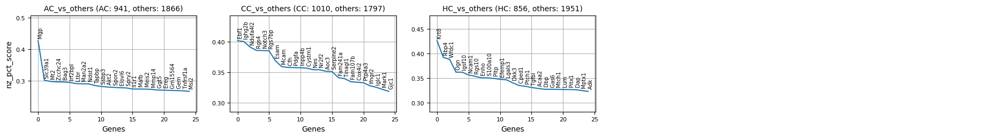

T cell CD4+


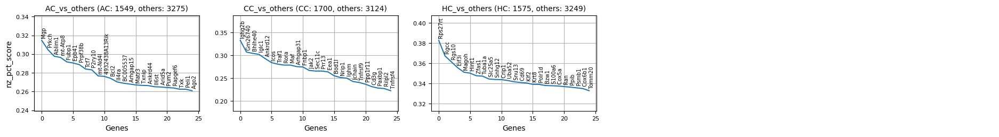

In [53]:
n_genes_to_show = 25

for key in df_deg_dct.keys():
    df_deg = df_deg_dct[key]
    nc_deg = nc_deg_dct[key]

    print(key)
    plot_deg( df_deg, reference = 'nz_pct_score',
              n_genes_to_show = n_genes_to_show, pval_cutoff = 0.01,
              figsize = (4,2), dpi = 100, text_fs = 7, title_fs = 10, label_fs = 10,
              tick_fs = 8, ncols = 5, wspace = 0.2, hspace = 0.5,
              deg_stat_dct = nc_deg, show_log_pv = False )


##### __세포유형별로 조건특이적인 마커 탐색하기__

In [54]:
adata_t

AnnData object with n_obs × n_vars = 38900 × 20582
    obs: 'sample', 'condition', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset'
    var: 'gene_ids', 'feature_types', 'variable_genes'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'Pathways_DB', 'analysis_parameters', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_pca'

In [55]:
nc_deg_dct = adata_t.uns['DEG_stat']
df_deg_dct = adata_t.uns['DEG']
df_deg_dct.keys()

dict_keys(['B cell', 'Dendritic cell', 'Endothelial cell', 'Fibroblast', 'ILC', 'Intestinal Epithelial cell', 'Macrophage', 'Plasma cell', 'Smooth muscle cell', 'T cell CD4+'])

In [56]:
# target_cell = 'Fibroblast'
# target_cell = 'Macrophage'
target_cell = 'Macrophage'
# target_cell = 'Aneuploid Epithelial cell'

df_deg_lst = df_deg_dct[target_cell]

mkr_dict = find_condition_specific_markers( df_deg_lst,
                                            score_col = 'nz_pct_score',
                                            n_markers_max = 60,
                                            score_th = 0.25,
                                            pval_cutoff = 0.05,
                                            surfaceome_only = False,
                                            verbose = True )

## Print results
for key in mkr_dict.keys():
    mkr_dict[key].sort()
    print('%s (%i): ' % (key, len(mkr_dict[key])), mkr_dict[key])


N_markers: 
   AC_vs_others (7371 -> 23) 
   CC_vs_others (7586 -> 318) 
   HC_vs_others (7510 -> 44)
N_markers_selected: AC (23), CC (60), HC (44)
AC (23):  ['Aebp2', 'C3', 'Cflar', 'Clec4e', 'Col3a1', 'Csrnp1', 'Fosl2', 'Furin', 'Ifi27l2a', 'Il1rn', 'Irf1', 'Isg15', 'Mgp', 'Nfat5', 'Nr4a1', 'Nr4a3', 'Ptgs2', 'Riok3', 'Sod1', 'Tle3', 'Tnfaip2', 'Zc3h7a', 'mt-Atp8']
CC (60):  ['AI662270', 'Adgre5', 'Anp32b', 'Aprt', 'Atp6v0d1', 'Atp6v0e', 'Atp6v1f', 'Atp6v1g1', 'Bri3', 'Card19', 'Cct5', 'Cct8', 'Cebpb', 'Clic1', 'Cmpk1', 'Cox7a2l', 'Cyth4', 'Dnajb11', 'Dnajc8', 'Dusp2', 'Eif3k', 'Eif4h', 'Erp29', 'Ezr', 'Gm10076', 'Got1', 'Hilpda', 'Hnrnpd', 'Ier3ip1', 'Ighg2b', 'Ighm', 'Kras', 'Lyn', 'Mkrn1', 'Mpc1', 'Ndufb11', 'Ndufb7', 'Ndufb8', 'Pomp', 'Psmb3', 'Psmb8', 'Psmd8', 'Pycard', 'Rac2', 'Rap1a', 'Rbx1', 'Scand1', 'Scp2', 'Snx20', 'Spcs2', 'Spty2d1', 'Ssb', 'Ssr4', 'Supt4a', 'Taf10', 'Tmed10', 'Tmem14c', 'Tomm20', 'Vapa', 'Zfp91']
HC (44):  ['Atf3', 'Blvrb', 'C1qa', 'C1qb', 'C1qc', 'Ccl3',

Num markers selected: 83 -> 83


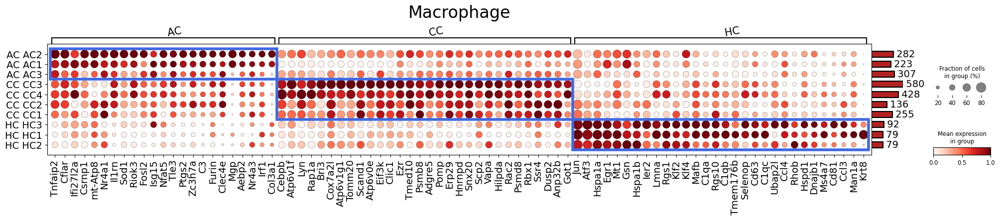

In [57]:
title = target_cell

celltype_col = adata_t.uns['DEG_grouping_vars'][target_cell]['celltype col']
cond_col = adata_t.uns['DEG_grouping_vars'][target_cell]['condition col']
sample_col = adata_t.uns['DEG_grouping_vars'][target_cell]['sample col']

b = adata_t.obs[celltype_col] == target_cell
adata_s = adata_t[b,:]

## Select samples with its No. of cells greater than 40
pcnt = adata_s.obs[sample_col].value_counts()
b = pcnt >= 40
plst = list(pcnt.index.values[b])
b = adata_s.obs[sample_col].isin(plst)
adata_ss = adata_s[b,:]

## UMAP with celltype annotation, sample, condition
sc.pp.normalize_total(adata_ss, target_sum=1e4)
sc.pp.log1p(adata_ss)

plot_marker_exp(adata_ss, markers = mkr_dict, var_group_col = cond_col,
                group_col = sample_col, group_categ_col = cond_col,
                title = title, title_y_pos = 2, title_fs = 24,
                text_fs = 14, linewidth = 4,
                var_group_height = 1.2, var_group_rotation = 10,
                standard_scale = 'var', nz_frac_max = 0.8, nz_frac_cutoff = 0.05,
                rem_mkrs_common_in_N_groups_or_more = 3, N_cells_min = 20,
                N_markers_per_group_max = 30, N_markers_total = 140,
                figsize = (24, 5), swap_ax = False, legend = True,
                add_rect = True )

##### __특정 마커들에 대한 violin plot 확인__

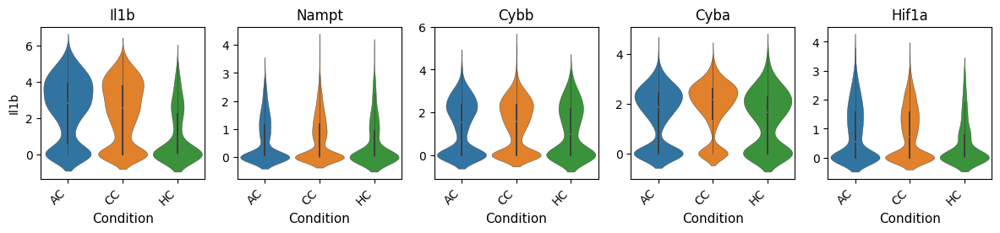

In [58]:
items_to_plot = ['Il1b', 'Nampt', 'Cybb', 'Cyba', 'Hif1a']

cond_col = 'condition'
df = adata_ss[:, items_to_plot].to_df()
df['group'] = adata_ss.obs[cond_col]

plot_violin( df, genes_lst = items_to_plot, group_col = 'group', scale = 'width',
             group_order = None, inner = 'box', width = 0.9, linewidth = 0.3, bw = 'scott',
             figsize = (2.5,2), dpi = 100,
             text_fs = 10, title = None, title_fs = 14, title_y_pos = 1,
             label_fs = 11, tick_fs = 10, xtick_rot = 45, xtick_ha = 'right',
             ncols = 5, wspace = 0.2, hspace = 0.3 )

##### __조건별로 유의하게 발현량 차이를 보이는 유전자들 확인__
- 요부분은 sample 별 Gene expression의 평균이 조건별로 유의하게 차이가 나는지 확인하는 부분입니다. (위 코드셀의 결과가 사용됩니다)
- 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고 sample이 많을 수록 통계적 유의성이 커짐. (p-value가 작아짐)

In [59]:
df_all = get_gene_expression_mean( adata_ss, genes = [], group_col = 'sample_ext' )
sample_group_map = adata_t.uns['lut_sample_to_cond']

df_res = test_group_diff( df_all, sample_group_map,
                          ref_group = None, pval_cutoff = 0.05 )

display(df_res)

,CC_vs_AC,HC_vs_AC,HC_vs_CC
Hoxa11os,0.002479,0.009857,0.000107
Samhd1,0.046256,0.018286,0.000017
Nme1,0.037616,0.037430,0.000013
Snx12,0.000571,0.025292,0.002200
Klkb1,0.001442,0.000968,0.024876
...,...,...,...
Snx22,0.039984,0.958912,0.577355
Gm20234,0.049842,0.551288,0.826354
Rmdn3,0.049372,0.566341,0.886142
Ldah,0.045536,0.687513,0.816116


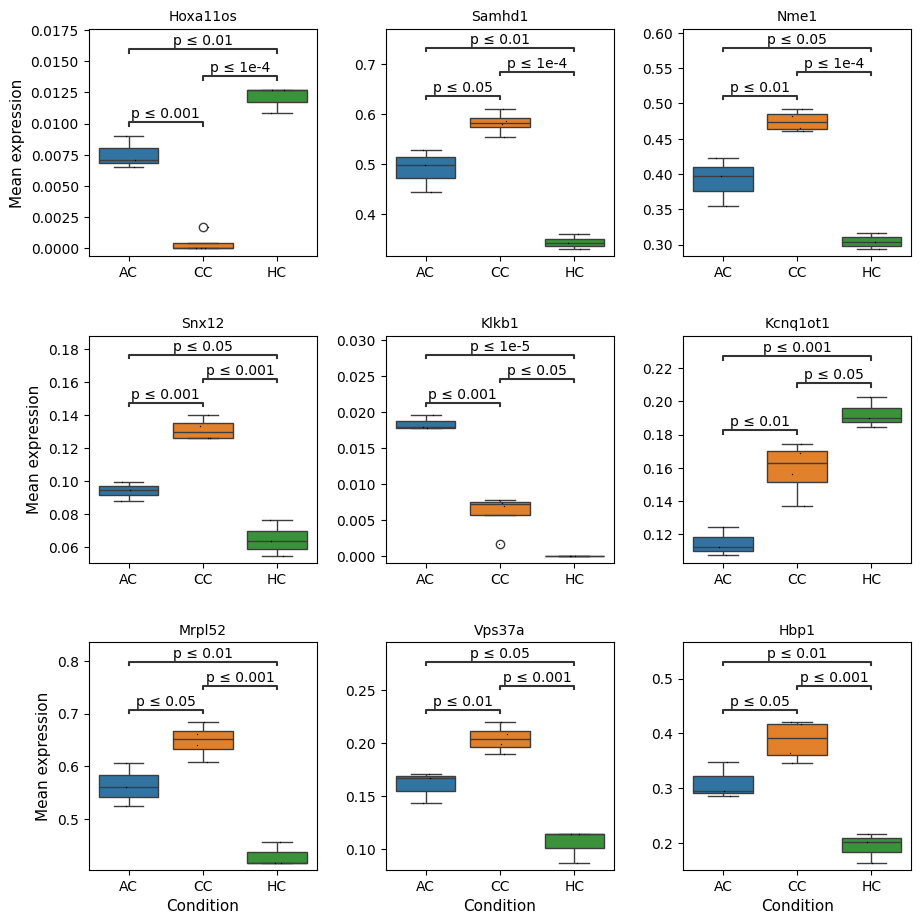

In [60]:
num_items_to_plot = 9
items_to_plot = df_res.iloc[:num_items_to_plot].index.values.tolist()

df_sel = get_gene_expression_mean( adata_ss, genes = items_to_plot,
                              group_col = 'sample_ext' )

if df_sel.shape[0] > 0:
    ## Show the first 5 CCIs
    plot_pct_box(df_sel, sample_group_map, ylabel = 'Mean expression',
                 ncols = 3, figsize = (3,3), dpi = 100,
                 title = None, title_y_pos = 1.05, title_fs = 12,
                 label_fs = 11, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
                 annot_ref = None, annot_fmt = 'simple', annot_fs = 10,
                 ws_hs = (0.3, 0.35), stripplot = True)

##### __유전자를 정해서 해당 유전자들이 조건별로 발현량 차이를 보이는지 확인__

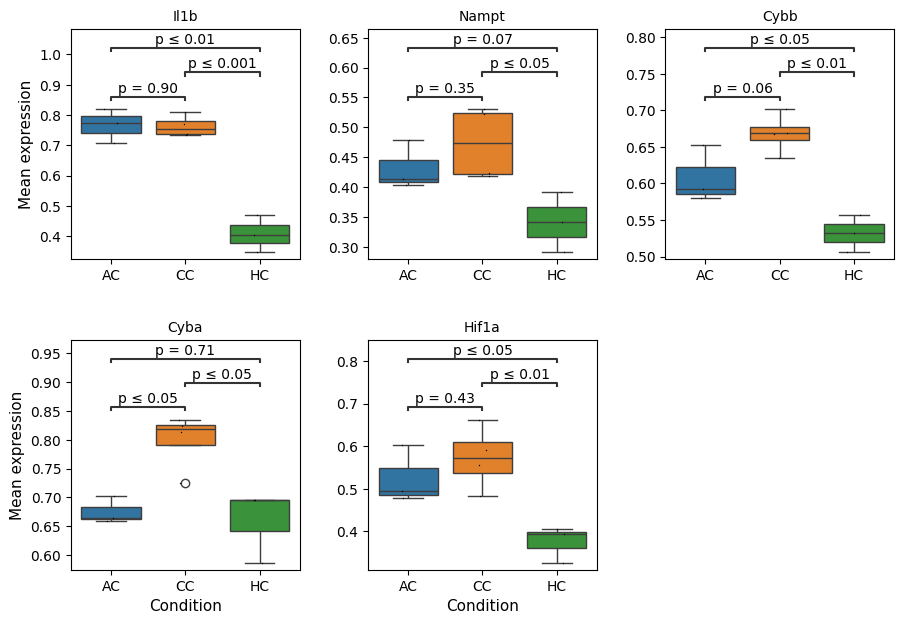

In [61]:
items_to_plot = ['Il1b', 'Nampt', 'Cybb', 'Cyba', 'Hif1a']

df_sel = get_gene_expression_mean( adata_ss, genes = items_to_plot,
                              group_col = 'sample_ext' )

if df_sel.shape[0] > 0:
    ## Show the first 5 CCIs
    plot_pct_box(df_sel, sample_group_map, ylabel = 'Mean expression',
                 ncols = 3, figsize = (3,3), dpi = 100,
                 title = None, title_y_pos = 1.05, title_fs = 12,
                 label_fs = 11, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
                 annot_ref = None, annot_fmt = 'simple', annot_fs = 10,
                 ws_hs = (0.3, 0.35), stripplot = True)

### __GSA 분석결과__

In [62]:
gsa_res_up = adata_t.uns['GSA_vs_ref_up']
gsa_res_dn = adata_t.uns['GSA_vs_ref_down']

list(gsa_res_up.keys())

['B cell',
 'Endothelial cell',
 'Fibroblast',
 'ILC',
 'Intestinal Epithelial cell',
 'Macrophage',
 'Plasma cell',
 'Smooth muscle cell',
 'T cell CD4+']

##### __GSA/GSEA 결과 데이터의 구성__

<div>
<img src="https://drive.google.com/uc?export=view&id=1RrmkpkWCI1rcfW5cIBfKvip-lX3lkJRL" align="center" width="500"/>
</div>

<div>
<img src=attachment:1369afc9-25a8-4811-bc55-41e7c61309af.png width="500"/>   
</div>

In [63]:
gsa_res = gsa_res_up
target_cell = 'Macrophage'

gsa_keys = list(gsa_res[target_cell].keys())
list(gsa_keys)

['AC_vs_HC', 'CC_vs_HC', 'HC_vs_others']

##### __GSA 결과 포맷__

In [64]:
gsa_res[target_cell][gsa_keys[2]].head()

,pval,pval_adj,genes,overlap,pw_size,-log(p-val),-log(q-val),Term,Ind
AGE-RAGE signaling pathway in diabetic complications,0.000001,0.023004,Tnf;Col1a1;Jun;Plcb4;Tgfbr2;Col1a2;Col3a1;Ccl2...,15,101,5.951683,1.638195,AGE-RAGE signaling pathway in diabetic complic...,1
Adherens junction,0.089483,1.000000,Cdh1;Acp1;Tgfbr2;Baiap2;Tgfbr1,5,72,1.048259,0.000000,Adherens junction,1
Amino sugar and nucleotide sugar metabolism,0.001070,1.000000,Gmds;Hk2;Hexb;Pmm1;Npl;Gnpnat1;Nans,7,49,2.970480,0.000000,Amino sugar and nucleotide sugar metabolism,1
Amoebiasis,0.000198,1.000000,Serpinb1a;Tnf;Col1a1;Plcb4;Col3a1;Muc2;Gna15;R...,12,106,3.702996,0.000000,Amoebiasis,1
Amphetamine addiction,0.001755,1.000000,Arc;Jun;Fosb;Calm2;Fos;Sirt1;Creb5;Maoa,8,68,2.755688,0.000000,Amphetamine addiction,1


##### __특정 세포 유형에 대한 GSA 결과 확인__

,pval,pval_adj,overlap,pw_size,-log(p-val),-log(q-val),Ind
AGE-RAGE signaling pathway in diabetic complications,1.436691e-09,0.000030,32,101,8.842636,4.529149,1
AMPK signaling pathway,5.866105e-04,1.000000,25,126,3.231650,0.000000,1
Acute myeloid leukemia,1.260091e-10,0.000003,27,69,9.899598,5.586111,1
Adherens junction,1.564837e-05,0.322075,20,72,4.805531,0.492043,1
Adipocytokine signaling pathway,1.814260e-07,0.003734,23,71,6.741300,2.427813,1


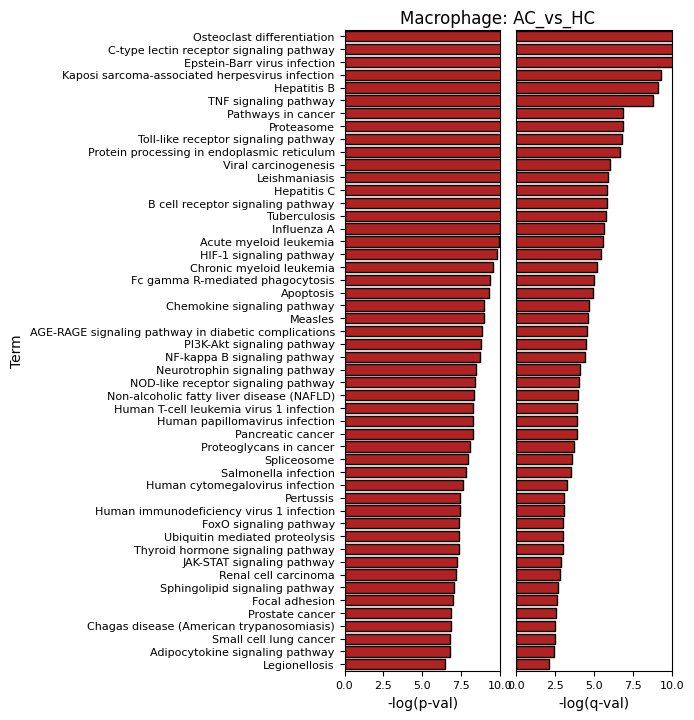

,pval,pval_adj,overlap,pw_size,-log(p-val),-log(q-val),Ind
AGE-RAGE signaling pathway in diabetic complications,3.490318e-06,0.071838,32,101,5.457135,1.143647,1
Acute myeloid leukemia,3.946761e-10,0.000008,31,69,9.403759,5.090272,1
Adherens junction,5.641120e-04,1.000000,21,72,3.248635,0.000000,1
Adipocytokine signaling pathway,1.557848e-02,1.000000,17,71,1.807475,0.000000,1
Aldosterone-regulated sodium reabsorption,3.089111e-02,1.000000,10,38,1.510166,0.000000,1


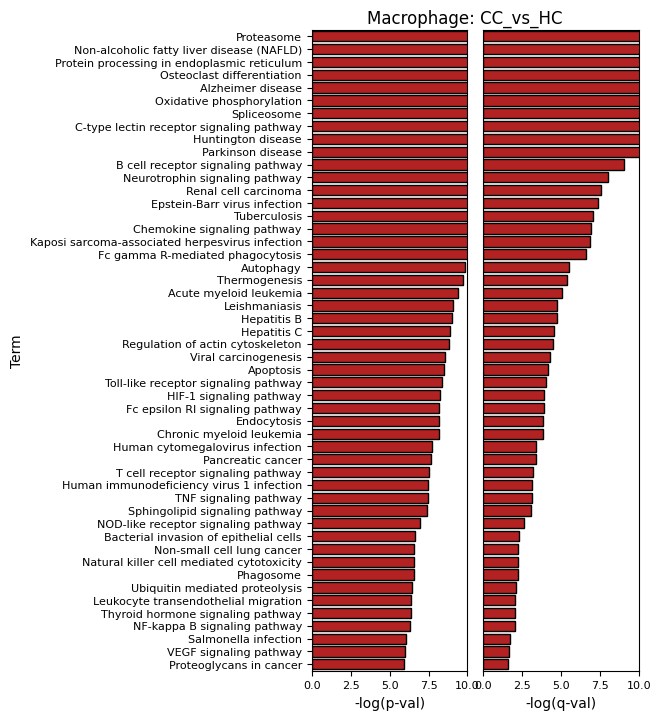

,pval,pval_adj,overlap,pw_size,-log(p-val),-log(q-val),Ind
AGE-RAGE signaling pathway in diabetic complications,0.000001,0.023004,15,101,5.951683,1.638195,1
Adherens junction,0.089483,1.000000,5,72,1.048259,0.000000,1
Amino sugar and nucleotide sugar metabolism,0.001070,1.000000,7,49,2.970480,0.000000,1
Amoebiasis,0.000198,1.000000,12,106,3.702996,0.000000,1
Amphetamine addiction,0.001755,1.000000,8,68,2.755688,0.000000,1


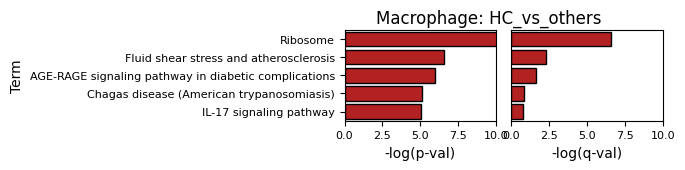

In [65]:
target_cell = 'Macrophage'

items_to_plot = ['-log(p-val)', '-log(q-val)']
lims = [[0, 10], [0, 10]]
N_max_to_show = 50
neg_log_p_cutoff = 5 ## p-value cutoff = 0.01

for target_cond in gsa_res[target_cell].keys():

    df_res_gsa = gsa_res[target_cell][target_cond]

    ## GSA 결과의 포맷 확인
    display(df_res_gsa.drop(columns = ['genes', 'Term']).head())

    if df_res_gsa.shape[0] > 0:

        ## p-value cutoff 조건에 맞는 term들만 선택
        df_res = df_res_gsa.copy(deep = True)
        df_res = df_res.loc[df_res['-log(p-val)'] >= neg_log_p_cutoff ]
        df_res = df_res.sort_values(by = '-log(p-val)', ascending = False).iloc[:min(df_res.shape[0], N_max_to_show)]
        terms_sel = list(df_res.index.values)

        plot_gsa_bar( df_res, terms_sel, items_to_plot, lims,
                      title = '%s: %s' % (target_cell, target_cond),
                      title_pos = (0.5, 1), title_fs = 12, title_ha = 'center',
                      label_fs = 10, tick_fs = 8, wspace=0.1, hspace=0.25, Ax = None)

##### __Dot plot으로 GSA 결과 요약__

In [66]:
gsa_res = adata_t.uns['GSA_vs_ref_up']
gsa_res.keys()

dict_keys(['B cell', 'Endothelial cell', 'Fibroblast', 'ILC', 'Intestinal Epithelial cell', 'Macrophage', 'Plasma cell', 'Smooth muscle cell', 'T cell CD4+'])

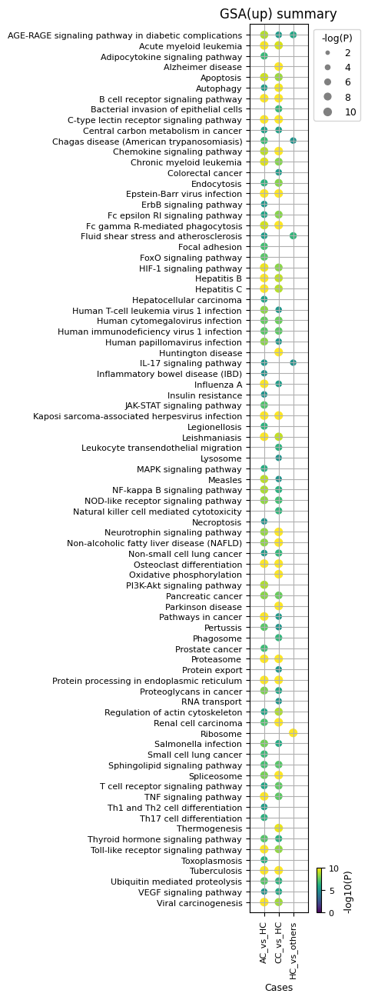

In [67]:
neg_log_p_cutoff = 5

key = 'Macrophage'
gsa_res_t = {key: filter_gsa_result( gsa_res[key], neg_log_p_cutoff )}

plot_gsa_dot( gsa_res_t, title = 'GSA(up) summary', title_fs = 12,
              tick_fs = 8, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 9, legend_fs = 9, swap_ax = False, figsize = (1.2,15),
              dpi = 100, dot_size = 50, cbar_frac = 0.1, cbar_aspect = 10, cmap = 'viridis' )

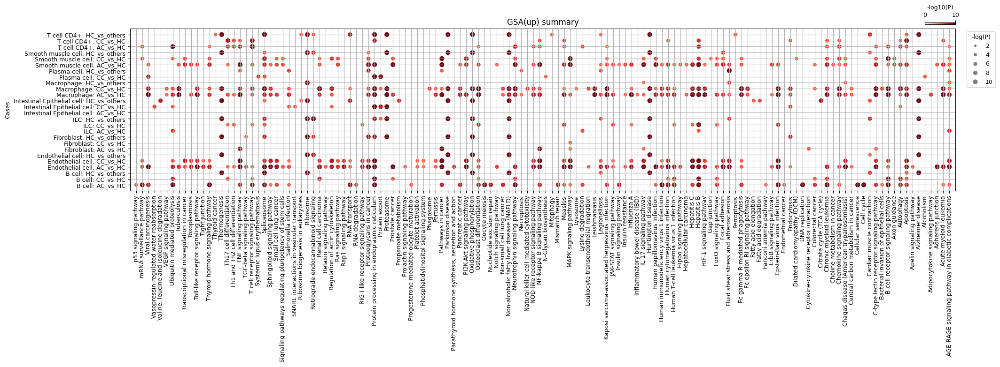

In [68]:
neg_log_p_cutoff = 5

gsa_res_t = {}
for key in gsa_res.keys():
    gsa_res_t[key] = filter_gsa_result( gsa_res[key], neg_log_p_cutoff )

plot_gsa_dot( gsa_res_t, title = 'GSA(up) summary', title_fs = 12,
              tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 9, legend_fs = 9, swap_ax = True, figsize = None,
              dpi = 100, dot_size = 40, cbar_frac = 0.05, cbar_aspect = 15, cmap = 'Reds' )

### __GSEA 분석결과__

In [69]:
gsea_res = adata_t.uns['GSEA_vs_ref']
list(gsea_res.keys())

['B cell',
 'Endothelial cell',
 'Fibroblast',
 'ILC',
 'Intestinal Epithelial cell',
 'Macrophage',
 'Plasma cell',
 'Smooth muscle cell',
 'T cell CD4+']

In [70]:
target_cell = 'Macrophage'

gsea_keys = list(gsea_res[target_cell].keys())
list(gsea_keys)

['AC_vs_HC', 'CC_vs_HC', 'HC_vs_others']

##### __특정 세포 유형에 대한 GSEA 결과 확인__

,Name,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,-log(p-val),-log(q-val)
Term,,,,,,,,,,
Ribosome,prerank,-0.647904,-2.951920,0.000000,0.001747,0.002,55/60,28.78%,20.000000,2.757635
Endocrine and other factor-regulated calcium reabsorption,prerank,-0.586116,-1.889439,0.031785,1.000000,0.812,4/12,3.97%,1.497780,-0.000000
Metabolism of xenobiotics by cytochrome P450,prerank,-0.670905,-1.886787,0.031100,1.000000,0.813,6/8,15.25%,1.507233,-0.000000
Arachidonic acid metabolism,prerank,-0.651149,-1.845271,0.042821,1.000000,0.846,6/9,5.80%,1.368342,-0.000000
Malaria,prerank,0.491582,1.813712,0.033439,1.000000,0.783,7/21,4.67%,1.475740,-0.000000


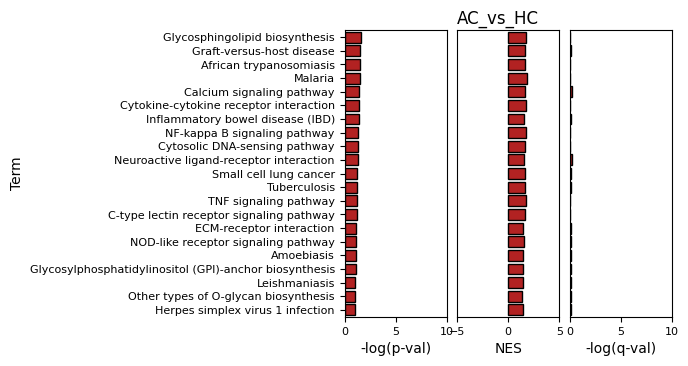

,Name,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,-log(p-val),-log(q-val)
Term,,,,,,,,,,
Protein digestion and absorption,prerank,-0.723033,-2.794653,0.000000,0.109078,0.050,11/18,6.43%,20.000000,0.962264
IL-17 signaling pathway,prerank,0.585723,2.382274,0.002878,0.386128,0.275,5/39,0.85%,2.540955,0.413269
Arachidonic acid metabolism,prerank,-0.742559,-2.280640,0.008357,1.000000,0.364,7/10,10.37%,2.077973,-0.000000
Metabolism of xenobiotics by cytochrome P450,prerank,-0.723867,-2.071503,0.008130,0.934801,0.459,6/8,7.56%,2.089905,0.029281
Neuroactive ligand-receptor interaction,prerank,0.593925,1.982244,0.028777,1.000000,0.846,9/17,8.62%,1.540955,-0.000000


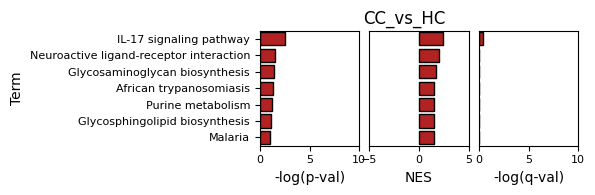

,Name,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,-log(p-val),-log(q-val)
Term,,,,,,,,,,
Arachidonic acid metabolism,prerank,0.644441,2.169978,0.005764,1.000000,0.391,7/12,6.32%,2.239299,-0.000000
Metabolism of xenobiotics by cytochrome P450,prerank,0.725735,2.121404,0.005634,1.000000,0.412,6/8,7.49%,2.249198,-0.000000
Neuroactive ligand-receptor interaction,prerank,-0.592603,-1.964792,0.028694,1.000000,0.681,11/18,14.51%,1.542203,-0.000000
Endocrine and other factor-regulated calcium reabsorption,prerank,0.600307,1.953916,0.005650,0.932599,0.521,4/11,2.75%,2.247973,0.030305
Ribosome,prerank,0.369815,1.901760,0.037975,0.765467,0.571,33/50,22.85%,1.420506,0.116074


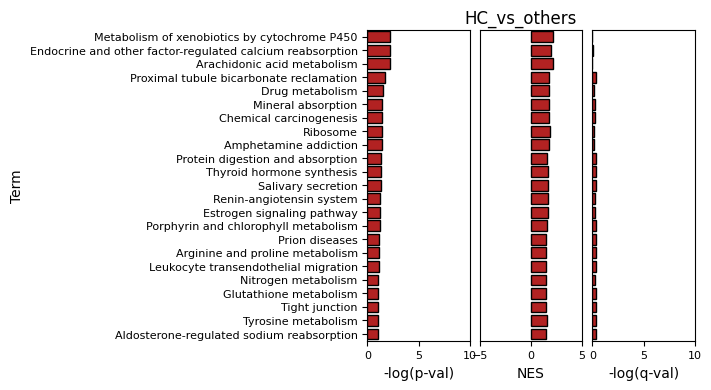

In [71]:
target_cell = 'Macrophage'
gsea_keys = list(gsea_res[target_cell].keys())

items_to_plot = ['-log(p-val)', 'NES', '-log(q-val)']
lims = [[0, 10], [-5, 5],  [0, 10]]
N_max_to_show = 30
neg_log_p_cutoff = 1
nes_cutoff = 0 ## selec those with NES > 0


for target_cond in gsea_keys:
    df_res_gsa = gsea_res[target_cell][target_cond]
    display(df_res_gsa.drop(columns = ['Lead_genes', 'Term']).head())

    df_res = df_res_gsa.copy(deep = True)
    df_res = df_res.loc[df_res['-log(p-val)'] >= neg_log_p_cutoff ]
    df_res = df_res.loc[df_res['NES'] >= nes_cutoff ]
    df_res = df_res.sort_values(by = '-log(p-val)', ascending = False).iloc[:min(df_res.shape[0], N_max_to_show)]
    terms_sel = list(df_res.index.values)

    if len(terms_sel) > 0:
        plot_gsa_bar( df_res, terms_sel, items_to_plot, lims,
                  title = target_cond, title_pos = (0.5, 1), title_fs = 12, title_ha = 'center',
                  label_fs = 10, tick_fs = 8, wspace=0.1, hspace=0.25, Ax = None)

##### __Dot plot으로 GSEA 결과 요약__

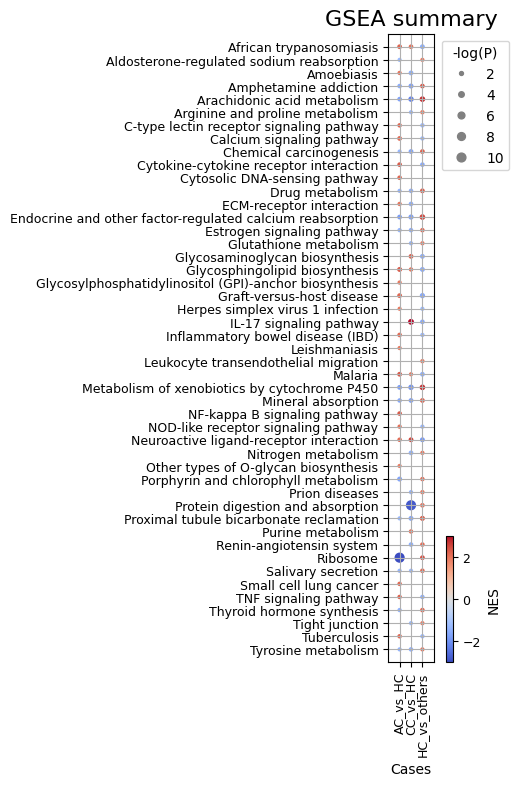

In [77]:
neg_log_p_cutoff = 1

gsea_res_t = {}
key = 'Macrophage'
gsea_res_t = {key: filter_gsa_result( gsea_res[key], neg_log_p_cutoff )}

plot_gsa_dot( gsea_res_t, title = 'GSEA summary', title_fs = 16,
              tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 10, legend_fs = 10, swap_ax = False, figsize = None, # (1,5),
              dpi = 100, dot_size = 40, cbar_frac = 0.2, cbar_aspect = 20, cmap = 'coolwarm' )

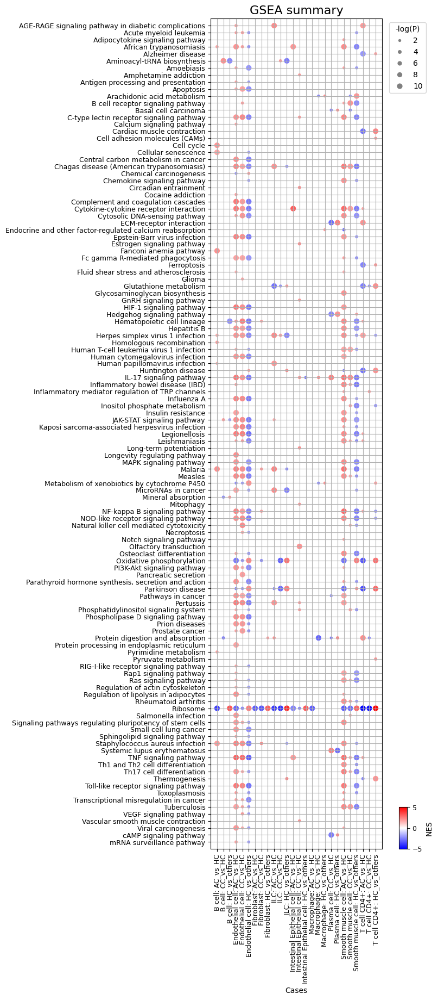

In [74]:
neg_log_p_cutoff = 2

gsea_res_t = {}
for key in gsea_res.keys():
    gsea_res_t[key] = filter_gsa_result( gsea_res[key], neg_log_p_cutoff )

plot_gsa_dot( gsea_res_t, title = 'GSEA summary', title_fs = 16,
              tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 10, legend_fs = 10, swap_ax = False,
              figsize = None, dpi = 100, dot_size = 40,
              cbar_frac = 0.2, cbar_aspect = 5, cmap = 'bwr' )